Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/50, Validation Accuracy: 81.02%, Training Accuracy: 85.26%
Epoch 2/50, Validation Accuracy: 93.22%, Training Accuracy: 96.03%
Epoch 3/50, Validation Accuracy: 87.80%, Training Accuracy: 91.84%
Epoch 4/50, Validation Accuracy: 87.46%, Training Accuracy: 96.26%
Epoch 5/50, Validation Accuracy: 93.90%, Training Accuracy: 97.85%
Epoch 6/50, Validation Accuracy: 91.19%, Training Accuracy: 99.55%
Epoch 7/50, Validation Accuracy: 88.81%, Training Accuracy: 98.19%
Epoch 8/50, Validation Accuracy: 85.76%, Training Accuracy: 95.01%
Epoch 9/50, Validation Accuracy: 81.69%, Training Accuracy: 93.20%
Early stopping on epoch 10
[np.int64(1), np.int64(1), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(0), np.int64(1), np.int64(1), np.int64(0), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(1), np.int64(0), np.int64(0), np.in

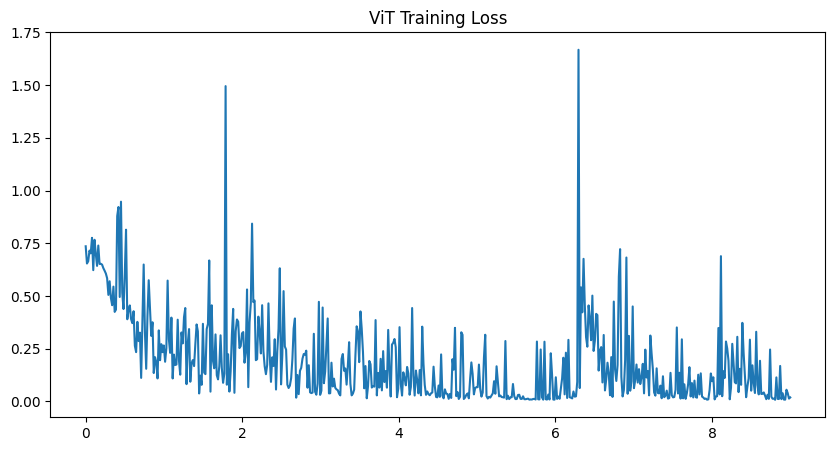

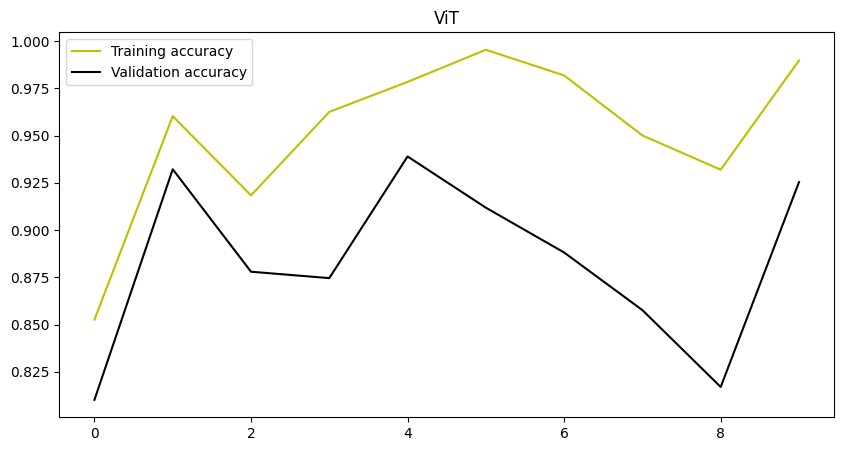

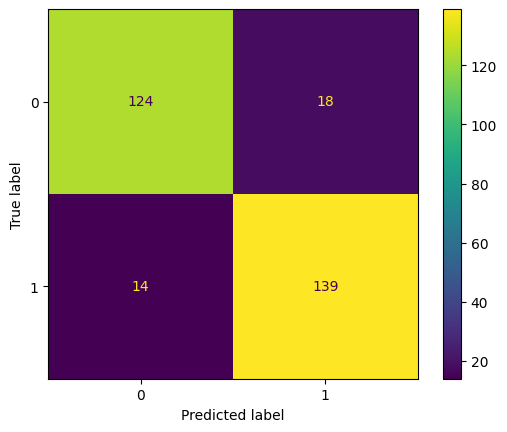

In [12]:
#Using Pre-Trained Model, Transfer Learning
import torch
import torchvision
from torchvision import datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, precision_score, recall_score, f1_score, accuracy_score
from PIL import Image
import shutil
import os
import matplotlib.pyplot as plt
from torch.utils.data import Dataset
from transformers import ViTForImageClassification, ViTFeatureExtractor
import numpy as np

# Define whether to use GPU or CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

batch_size = 16
num_epochs = 10
learning_rate = 1e-4
patch_size = 4

root_dir = 'C:/Users/Thomas/coding/FDMProj/FDM Resources/Images - wCycleGAN'

# Loading a pre-trained ViT model and feature extractor
model_name = "google/vit-base-patch16-224-in21k"  # ViT model name
model = ViTForImageClassification.from_pretrained(model_name, num_labels=len(os.listdir(root_dir)))
#, hidden_dropout_prob=0.5
feature_extractor = ViTFeatureExtractor.from_pretrained(model_name)

# Move the model to GPU if available
model.to(device)

# Transform to match ViT input size and normalization
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # ViT expects 224x224 input images
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Pre-trained ViT normalization
])

class CustomImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir  # Path to the root directory containing categories
        self.transform = transform
        self.image_paths = []  # List to store paths of all images
        self.labels = []  # List to store corresponding labels

        # Get all the subdirectories (i.e., categories) in the root directory
        self.class_names = os.listdir(root_dir)  # This gives you folder names (labels)

        # Create a mapping from class name to class index (label)
        self.class_to_idx = {class_name: idx for idx, class_name in enumerate(self.class_names)}

        # Loop through each category folder
        for class_name in self.class_names:
            category_folder = os.path.join(root_dir, class_name)

            # Ensure it's a folder (not a file)
            if os.path.isdir(category_folder):
                # Loop through each image in the folder
                for img_name in os.listdir(category_folder):
                    img_path = os.path.join(category_folder, img_name)

                    # Only consider image files
                    if img_path.endswith(('.jpg')):
                        self.image_paths.append(img_path)
                        self.labels.append(self.class_to_idx[class_name])  # Assign label based on folder name

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        # Get the image and label based on the index
        img_path = self.image_paths[idx]
        label = self.labels[idx]
        image = Image.open(img_path)

        # Apply any transformations (like ToTensor, normalization, etc.)
        if self.transform:
            image = self.transform(image)

        return image, label

dataset = CustomImageDataset(root_dir=root_dir, transform=transform)

train_paths, test_paths = train_test_split(dataset.image_paths, test_size=0.2, random_state=15)
train_paths, val_paths = train_test_split(train_paths, test_size=0.25, random_state=15)  # 0.25 * 0.8 = 0.2 validation

# Function to copy files into the appropriate directories
def copy_images_to_dir(image_paths, target_dir):
    for path in image_paths:
        class_name = path.split('\\')[-2]
        target_class_dir = os.path.join(target_dir, class_name)
        if not os.path.exists(target_class_dir):
            os.makedirs(target_class_dir)
            #print(f"Created directory: {target_class_dir}")
        #print(f"Copying image: {path} to {target_class_dir}")
        shutil.copy(path, target_class_dir)

train_dir = 'C:/Users/Thomas/coding/FDMProj/FDM Resources/train'
val_dir = 'C:/Users/Thomas/coding/FDMProj/FDM Resources/val'
test_dir = 'C:/Users/Thomas/coding/FDMProj/FDM Resources/test'

#FOR SEPARATION OF TRAINING,TEST,VALIDATION SETS INTO FILES

copy_images_to_dir(train_paths, train_dir)
copy_images_to_dir(val_paths, val_dir)
copy_images_to_dir(test_paths, test_dir)

train_dataset = datasets.ImageFolder(root=train_dir, transform=transform)
val_dataset = datasets.ImageFolder(root=val_dir, transform=transform)
test_dataset = datasets.ImageFolder(root=test_dir, transform=transform)

train_loader = torch.utils.data.DataLoader(train_dataset, shuffle=True, batch_size=batch_size)
valid_loader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size)
test_loader  = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size)

#viewing labels
# print(train_dataset.class_to_idx)

# for images, labels in train_loader:
#   print(images.shape)
#   print(labels)

optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)
criterion = torch.nn.CrossEntropyLoss()
num_epochs = 50



# Model evaluation function
def evaluate_model(model, dataloader):
    model.eval()  # Set model to evaluation mode
    correct_predictions = 0
    total_predictions = 0
    true_labels = []
    predicted_values = []
    with torch.no_grad():
        for images, labels in dataloader:
            # Move images and labels to GPU if available
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.logits, 1)
            total_predictions += labels.size(0)
            correct_predictions += (predicted == labels).sum().item()
            true_labels.extend(predicted.cpu().numpy())
            predicted_values.extend(labels.cpu().numpy())
    accuracy = correct_predictions / total_predictions
    return accuracy, true_labels, predicted_values

# Early stopping parameters
patience = 5  # Number of epochs with no improvement after which training will stop
best_val_accuracy = 0.0 
epochs_without_improvement = 0

training_loss_logger = []
validation_acc_logger = []
training_acc_logger = []

valid_acc = 0
train_acc = 0
early_epoch = 0

# Training loop
for epoch in range(num_epochs):
    model.train()  # Set model to training mode
    for images, labels in train_loader:
        # Move images and labels to GPU if available
        images = images.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()  # Clear gradients
        outputs = model(images)  # Forward pass
        loss = criterion(outputs.logits, labels)  # Calculate loss
        loss.backward()  # Backpropagation
        training_loss_logger.append(loss.item())
        optimizer.step()  # Optimizer step

    # Evaluate after each epoch
    val_accuracy, _, _ = evaluate_model(model, valid_loader)
    training_accuracy,_,_ = evaluate_model(model, train_loader)

    validation_acc_logger.append(val_accuracy)
    training_acc_logger.append(training_accuracy)

    # Early stopping based on validation accuracy
    if val_accuracy > best_val_accuracy:
        best_val_accuracy = val_accuracy
        epochs_without_improvement = 0
    else:
        epochs_without_improvement += 1

    if epochs_without_improvement >= patience:
        early_epoch = epoch
        print(f"Early stopping on epoch {epoch + 1}")
        break
    print(f"Epoch {epoch + 1}/{num_epochs}, Validation Accuracy: {val_accuracy * 100:.2f}%, Training Accuracy: {training_accuracy * 100:.2f}%")

plt.figure(figsize = (10,5))
train_x = np.linspace(0, early_epoch, len(training_loss_logger))
plt.plot(train_x, training_loss_logger)
_ = plt.title("ViT Training Loss")

plt.figure(figsize = (10,5))
train_x = np.linspace(0, early_epoch, len(training_acc_logger))
plt.plot(train_x, training_acc_logger, c = "y")
valid_x = np.linspace(0, early_epoch, len(validation_acc_logger))
plt.plot(valid_x, validation_acc_logger, c = "k")

plt.title("ViT")
_ = plt.legend(["Training accuracy", "Validation accuracy"])

# Test the model on the test set
test_accuracy, test_labels, test_predicted = evaluate_model(model, test_loader)
print(test_labels)
print(test_predicted)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

accuracy = accuracy_score(test_labels, test_predicted)
print(f"Test Accuracy: {accuracy}%")
precision = precision_score(test_labels, test_predicted, average='weighted')
print(f"Test Precision: {precision}%")
recall = recall_score(test_labels, test_predicted, average='weighted')
print(f"Test Recall: {recall}%")
f1 = f1_score(test_labels, test_predicted, average='weighted')
print(f"Test F1 Score: {f1}%")

cm = confusion_matrix(test_labels, test_predicted)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
c:\Users\Thomas\coding\FDMProj\.venv\Lib\site-packages\transformers\models\vit\feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


Validation Accuracy: 56.27%
Test Accuracy: 54.24%
Test Accuracy: 0.5423728813559322%
Test Precision: 0.6466094654281409%
Test Recall: 0.5423728813559322%
Test F1 Score: 0.5718133826562305%


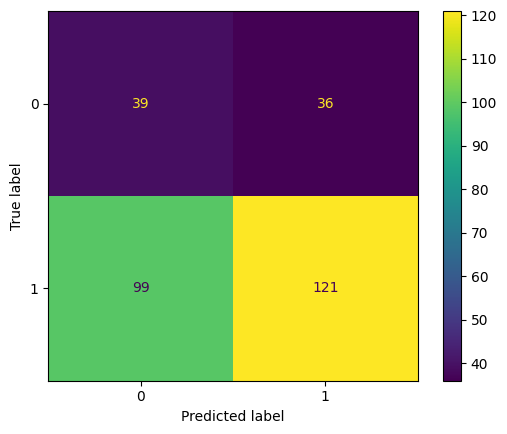

In [22]:
#Using Pre-Trained Model, Transfer Learning
import torch
import torchvision
from torchvision import datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, precision_score, recall_score, f1_score, accuracy_score
from PIL import Image
import shutil
import os
import matplotlib.pyplot as plt
from torch.utils.data import Dataset
from transformers import ViTForImageClassification, ViTFeatureExtractor

root_dir = 'FDM Resources/Images - wCycleGAN'

# Loading a pre-trained ViT model and feature extractor
model_name = "google/vit-base-patch16-224-in21k"  # ViT model name
model = ViTForImageClassification.from_pretrained(model_name, num_labels=len(os.listdir(root_dir)))
feature_extractor = ViTFeatureExtractor.from_pretrained(model_name)

# Transform to match ViT input size and normalization
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # ViT expects 224x224 input images
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Pre-trained ViT normalization
])

class CustomImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir  # Path to the root directory containing categories
        self.transform = transform
        self.image_paths = []  # List to store paths of all images
        self.labels = []  # List to store corresponding labels

        # Get all the subdirectories (i.e., categories) in the root directory
        self.class_names = os.listdir(root_dir)  # This gives you folder names (labels)

        # Create a mapping from class name to class index (label)
        self.class_to_idx = {class_name: idx for idx, class_name in enumerate(self.class_names)}

        # Loop through each category folder
        for class_name in self.class_names:
            category_folder = os.path.join(root_dir, class_name)

            # Ensure it's a folder (not a file)
            if os.path.isdir(category_folder):
                # Loop through each image in the folder
                for img_name in os.listdir(category_folder):
                    img_path = os.path.join(category_folder, img_name)

                    # Only consider image files
                    if img_path.endswith(('.jpg')):
                        self.image_paths.append(img_path)
                        self.labels.append(self.class_to_idx[class_name])  # Assign label based on folder name

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        # Get the image and label based on the index
        img_path = self.image_paths[idx]
        label = self.labels[idx]
        image = Image.open(img_path)

        # Apply any transformations (like ToTensor, normalization, etc.)
        if self.transform:
            image = self.transform(image)

        return image, label

dataset = CustomImageDataset(root_dir=root_dir, transform=transform)

train_paths, test_paths = train_test_split(dataset.image_paths, test_size=0.2, random_state=15)
train_paths, val_paths = train_test_split(train_paths, test_size=0.25, random_state=15)  # 0.25 * 0.8 = 0.2 validation

# Function to copy files into the appropriate directories
def copy_images_to_dir(image_paths, target_dir):
    for path in image_paths:
        class_name = path.split('\\')[-2]
        target_class_dir = os.path.join(target_dir, class_name)
        if not os.path.exists(target_class_dir):
            os.makedirs(target_class_dir)
        shutil.copy(path, target_class_dir)

train_dir = 'FDM Resources/train'
val_dir = 'FDM Resources/val'
test_dir = 'FDM Resources/test'

#FOR SEPARATION OF TRAINING,TEST,VALIDATION SETS INTO FILES

copy_images_to_dir(train_paths, train_dir)
copy_images_to_dir(val_paths, val_dir)
copy_images_to_dir(test_paths, test_dir)

train_dataset = datasets.ImageFolder(root=train_dir, transform=transform)
val_dataset = datasets.ImageFolder(root=val_dir, transform=transform)
test_dataset = datasets.ImageFolder(root=test_dir, transform=transform)

train_loader = torch.utils.data.DataLoader(train_dataset, shuffle=True, batch_size=batch_size)
valid_loader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size)
test_loader  = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size)

#viewing labels
# print(train_dataset.class_to_idx)

# for images, labels in train_loader:
#   print(images.shape)
#   print(labels)

# Model evaluation function
def evaluate_model(model, dataloader):
    true_labels = []
    predicted_values = []
    model.eval()  # Set model to evaluation mode
    correct_predictions = 0
    total_predictions = 0
    with torch.no_grad():
        for images, labels in dataloader:
            outputs = model(images)
            _, predicted = torch.max(outputs.logits, 1)
            total_predictions += labels.size(0)
            correct_predictions += (predicted == labels).sum().item()
            true_labels.extend(labels.cpu().numpy())
            predicted_values.extend(predicted.cpu().numpy())
        accuracy = correct_predictions / total_predictions
    return accuracy, predicted_values, true_labels

# Evaluate the model on the validation set
val_accuracy, _, _ = evaluate_model(model, valid_loader)
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

# Test the model on the test set
test_accuracy, test_labels, test_predicted  = evaluate_model(model, test_loader)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

accuracy = accuracy_score(test_labels, test_predicted)
print(f"Test Accuracy: {accuracy}%")
precision = precision_score(test_labels, test_predicted, average='weighted')
print(f"Test Precision: {precision}%")
recall = recall_score(test_labels, test_predicted, average='weighted')
print(f"Test Recall: {recall}%")
f1 = f1_score(test_labels, test_predicted, average='weighted')
print(f"Test F1 Score: {f1}%")

cm = confusion_matrix(test_labels, test_predicted)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

-This Model Has 67586 (Approximately 0 Million) Parameters!


Training Complete


The total test accuracy is: 85.08%
Test Accuracy: 0.8508474576271187%
Test Precision: 0.8560279004563173%
Test Recall: 0.8508474576271187%
Test F1 Score: 0.8509297335537747%


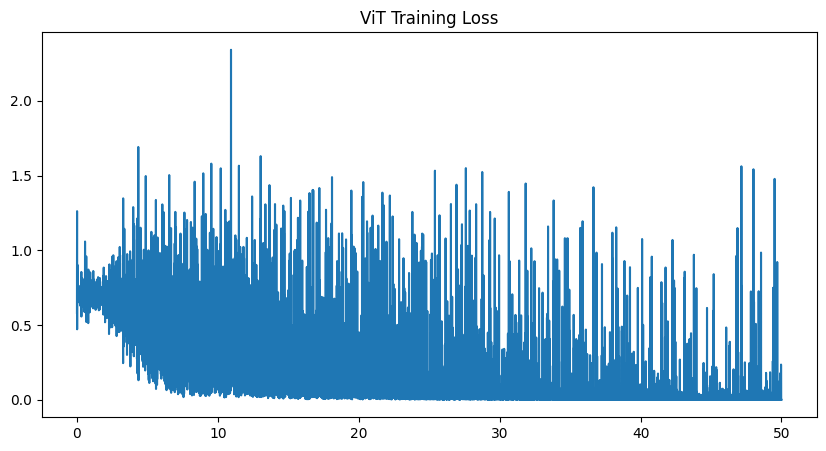

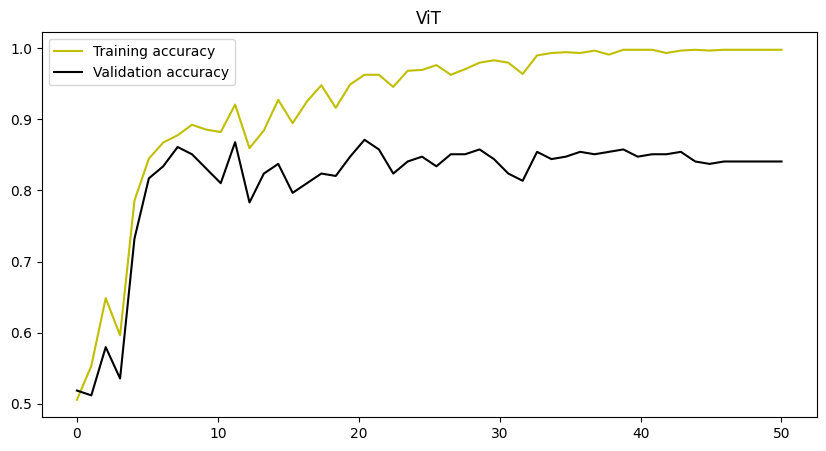

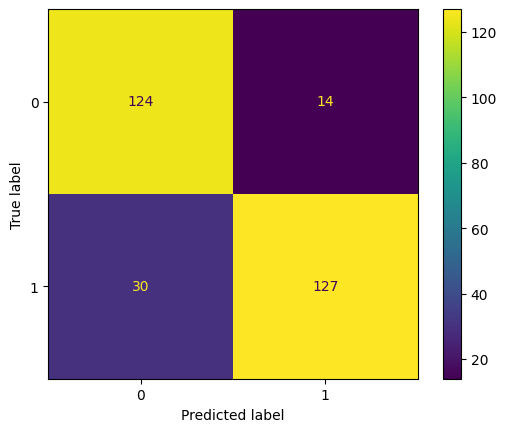

Predicted Values
 [np.int64(0), np.int64(0), np.int64(0), np.int64(1)]
True Values
 [np.int64(0), np.int64(0), np.int64(0), np.int64(0)]


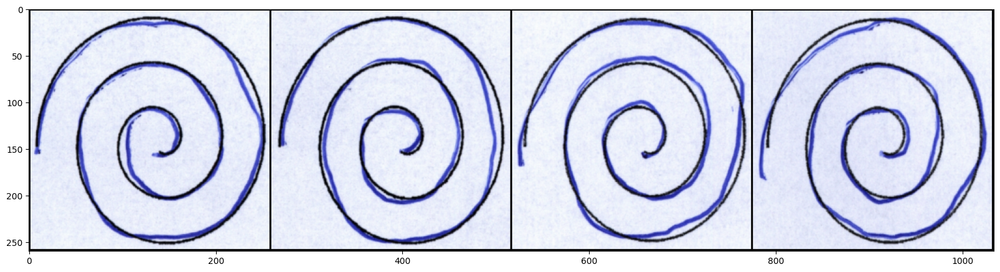

In [16]:
import torch.nn as nn
import torch.optim as optim
from tqdm import trange, tqdm
import numpy as np
import torch
import torchvision
from torchvision import datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, precision_score, recall_score, f1_score, accuracy_score
from PIL import Image
import shutil
import os
import matplotlib.pyplot as plt
from torch.utils.data import Dataset
import numpy as np
import torchvision.transforms as transforms

# Define whether to use GPU or CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

batch_size = 4
num_epochs = 50
learning_rate = 1e-4
patch_size = 16

root_dir = 'C:/Users/Thomas/coding/FDMProj/FDM Resources/Images - wCycleGAN'

transform = transforms.Compose([transforms.Resize((256, 256)),transforms.ToTensor(),transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])])

class CustomImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir  # Path to the root directory containing categories
        self.transform = transform
        self.image_paths = []  # List to store paths of all images
        self.labels = []  # List to store corresponding labels

        # Get all the subdirectories (i.e., categories) in the root directory
        self.class_names = os.listdir(root_dir)  # This gives you folder names (labels)

        # Create a mapping from class name to class index (label)
        self.class_to_idx = {class_name: idx for idx, class_name in enumerate(self.class_names)}

        # Loop through each category folder
        for class_name in self.class_names:
            category_folder = os.path.join(root_dir, class_name)

            # Ensure it's a folder (not a file)
            if os.path.isdir(category_folder):
                # Loop through each image in the folder
                for img_name in os.listdir(category_folder):
                    img_path = os.path.join(category_folder, img_name)

                    # Only consider image files
                    if img_path.endswith(('.jpg')):
                        self.image_paths.append(img_path)
                        self.labels.append(self.class_to_idx[class_name])  # Assign label based on folder name

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        # Get the image and label based on the index
        img_path = self.image_paths[idx]
        label = self.labels[idx]
        image = Image.open(img_path)

        # Apply any transformations (like ToTensor, normalization, etc.)
        if self.transform:
            image = self.transform(image)

        return image, label

dataset = CustomImageDataset(root_dir=root_dir, transform=transform)

train_paths, test_paths = train_test_split(dataset.image_paths, test_size=0.2, random_state=15)
train_paths, val_paths = train_test_split(train_paths, test_size=0.25, random_state=15)  # 0.25 * 0.8 = 0.2 validation

# Function to copy files into the appropriate directories
def copy_images_to_dir(image_paths, target_dir):
    for path in image_paths:
        class_name = path.split('\\')[-2]
        target_class_dir = os.path.join(target_dir, class_name)
        if not os.path.exists(target_class_dir):
            os.makedirs(target_class_dir)
            #print(f"Created directory: {target_class_dir}")
        #print(f"Copying image: {path} to {target_class_dir}")
        shutil.copy(path, target_class_dir)

train_dir = 'C:/Users/Thomas/coding/FDMProj/FDM Resources/train'
val_dir = 'C:/Users/Thomas/coding/FDMProj/FDM Resources/val'
test_dir = 'C:/Users/Thomas/coding/FDMProj/FDM Resources/test'

#FOR SEPARATION OF TRAINING,TEST,VALIDATION SETS INTO FILES

# copy_images_to_dir(train_paths, train_dir)
# copy_images_to_dir(val_paths, val_dir)
# copy_images_to_dir(test_paths, test_dir)

train_dataset = datasets.ImageFolder(root=train_dir, transform=transform)
val_dataset = datasets.ImageFolder(root=val_dir, transform=transform)
test_dataset = datasets.ImageFolder(root=test_dir, transform=transform)

train_loader = torch.utils.data.DataLoader(train_dataset, shuffle=True, batch_size=batch_size)
valid_loader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size)
test_loader  = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size)

# #viewing labels
# print(train_dataset.class_to_idx)

# for images, labels in train_loader:
#   print(images.shape)
#   print(labels)

#Extract Patches of image fed in
def extract_patches(image, patch_size):
  bs,c,h,w = image.shape # batch size, channels (RGB), height, width
  unfold = torch.nn.Unfold(kernel_size=patch_size, stride=patch_size) #extracts sliding patches from input img tensor, stride of patch size means no overlap
  unfolded = unfold(image)
  unfolded = unfolded.transpose(1,2).reshape(bs, -1, c, patch_size, patch_size) #changes from columns to rows, reshapes based on patches
  return unfolded

# Create a dataloader itterable object
dataiter = next(iter(test_loader))
# Sample from the itterable object
test_images, test_labels_data = dataiter

#Transformer block with self-attention
class TransformerBlock(nn.Module):
    def __init__(self, hidden_size=128, num_heads=4):
        # Initialize the parent nn.Module
        super(TransformerBlock, self).__init__()

        # Layer normalization to normalize the input data
        self.norm1 = nn.LayerNorm(hidden_size)

        # Multi-head attention mechanism
        self.multihead_attn = nn.MultiheadAttention(hidden_size, num_heads=num_heads,
                                                    batch_first=True, dropout=0.1)

        # Another layer normalization
        self.norm2 = nn.LayerNorm(hidden_size)

        # Multi-layer perceptron (MLP) with a hidden layer and activation function
        self.mlp = nn.Sequential(
            nn.Linear(hidden_size, hidden_size * 2),
            nn.LayerNorm(hidden_size * 2),
            nn.ELU(),
            nn.Linear(hidden_size * 2, hidden_size)
        )

    def forward(self, x):
        # Apply the first layer normalization
        norm_x = self.norm1(x)

        # Apply multi-head attention and add the input (residual connection)
        x = self.multihead_attn(norm_x, norm_x, norm_x)[0] + x

        # Apply the second layer normalization
        norm_x = self.norm2(x)

        # Pass through the MLP and add the input (residual connection)
        x = self.mlp(norm_x) + x

        return x

class ViT(nn.Module):
    def __init__(self, image_size, channels_in, patch_size, hidden_size, num_layers, num_heads=8):
        # Call the __init__ function of the parent nn.Module class
        super(ViT, self).__init__()

        self.patch_size = patch_size

        # Fully connected layer to project input patches to the hidden size dimension
        self.fc_in = nn.Linear(channels_in * patch_size * patch_size, hidden_size)

        # Create a list of Transformer blocks
        self.blocks = nn.ModuleList([
            TransformerBlock(hidden_size, num_heads) for _ in range(num_layers)
        ])

        # Fully connected output layer to map to the number of classes (e.g., 10 for CIFAR-10)
        self.fc_out = nn.Linear(hidden_size, 2)

        # Parameter for the output token
        self.out_vec = nn.Parameter(torch.zeros(1, 1, hidden_size))

        # Positional embeddings to retain positional information of patches
        seq_length = (image_size // patch_size) ** 2
        self.pos_embedding = nn.Parameter(torch.empty(1, seq_length, hidden_size).normal_(std=0.001))

    def forward(self, image):
        bs = image.shape[0]

        # Extract patches from the image and flatten them
        patch_seq = extract_patches(image, patch_size=self.patch_size)

        # Flatten the patch_seq to be compatible with the fully connected layer
        # The shape of patch_seq is (batch_size, num_patches, patch_size * patch_size * channels_in)
        patch_seq = patch_seq.view(bs, -1, self.patch_size * self.patch_size * image.shape[1])

        # Project patches to the hidden size dimension
        patch_emb = self.fc_in(patch_seq)

        # Add positional embeddings to the patch embeddings
        patch_emb = patch_emb + self.pos_embedding

        # Concatenate the output token to the patch embeddings
        embs = torch.cat((self.out_vec.expand(bs, 1, -1), patch_emb), 1)

        # Pass the embeddings through each Transformer block
        for block in self.blocks:
            embs = block(embs)

        # Use the embedding of the output token for classification
        return self.fc_out(embs[:, 0])


# Create a dataloader itterable object
dataiter = next(iter(train_loader))
# Sample from the itterable object
train_images, train_labels = dataiter

# Lets visualise an entire batch of images!
# plt.figure(figsize = (20,10))
# out = torchvision.utils.make_grid(train_images, 8, normalize=True)
# _ = plt.imshow(out.numpy().transpose((1, 2, 0)))

# Create an instance of our network
# Set channels_in to the number of channels of the dataset images (1 channel for MNIST)
model = ViT(image_size=test_images.shape[2],
            channels_in=test_images.shape[1],
            patch_size=patch_size,
            hidden_size=32,
            num_layers=4,
            num_heads=4).to(device)

# View the network
# Note that the layer order is simply the order in which we defined them, NOT the order of the forward pass
# print(model)

#Let's see how many Parameters our Model has!
num_model_params = 0
for param in model.parameters():
    num_model_params += param.flatten().shape[0]

print("-This Model Has %d (Approximately %d Million) Parameters!" % (num_model_params, num_model_params//1e6))

# Pass image through network
out = model(test_images.to(device))
# Check output
out.shape

# Pass our network parameters to the optimiser set our lr as the learning_rate
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

lr_scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer,
                                                    T_max=num_epochs,
                                                    eta_min=0)
# Define a Cross Entropy Loss
loss_fun = nn.CrossEntropyLoss()

# This function should perform a single training epoch using our training data
def train(model, optimizer, loader, device, loss_fun, loss_logger):

    # Set Network in train mode
    model.train()
    for i, (x, y) in enumerate(tqdm(loader, leave=False, desc="Training")):
        # Forward pass of image through network and get output
        fx = model(x.to(device))

        # Calculate loss using loss function
        loss = loss_fun(fx, y.to(device))

        # Zero Gradents
        optimizer.zero_grad()
        # Backpropagate Gradents
        loss.backward()
        # Do a single optimization step
        optimizer.step()

        # Log the loss for plotting
        loss_logger.append(loss.item())

    # Return the avaerage loss and acc from the epoch as well as the logger array
    return model, optimizer, loss_logger

# This function should perform a single evaluation epoch, it WILL NOT be used to train our model
def evaluate(model, device, loader):

    # Initialise counter
    correct = 0
    true_labels = []
    predicted_values = []

    # Set network in evaluation mode
    # Layers like Dropout will be disabled
    # Layers like Batchnorm will stop calculating running mean and standard deviation
    # and use current stored values (More on these layer types soon!)
    model.eval()

    with torch.no_grad():
        for i, (image, label) in enumerate(tqdm(loader, leave=False, desc="Evaluating")):
            # Forward pass of image through network
            fx = model(image.to(device))
            predictions = fx.argmax(1)
            image_label = label.to(device)

            # Log the cumulative sum of the acc
            correct += (predictions == image_label).sum().item()

            true_labels.extend(image_label.cpu().numpy())
            predicted_values.extend(predictions.cpu().numpy())

    # Return the accuracy from the epoch
    return correct / len(loader.dataset), true_labels, predicted_values

training_loss_logger = []
validation_acc_logger = []
training_acc_logger = []

valid_acc = 0
train_acc = 0

# This cell implements our training loop
pbar = trange(0, num_epochs, leave=False, desc="Epoch")
for epoch in pbar:
    pbar.set_postfix_str('Accuracy: Train %.2f%%, Val %.2f%%' % (train_acc * 100, valid_acc * 100))

    # Call the training function and pass training dataloader etc
    model, optimizer, training_loss_logger = train(model=model,
                                                   optimizer=optimizer,
                                                   loader=train_loader,
                                                   device=device,
                                                   loss_fun=loss_fun,
                                                   loss_logger=training_loss_logger)

    # Call the evaluate function and pass the dataloader for both validation and training
    train_acc, _, _ = evaluate(model=model, device=device,loader=train_loader)
    valid_acc, _, _ = evaluate(model=model, device=device,loader=valid_loader)

    # Log the train and validation accuracies
    validation_acc_logger.append(valid_acc)
    training_acc_logger.append(train_acc)

    # Reduce learning rate
    lr_scheduler.step()

print("Training Complete")

plt.figure(figsize = (10,5))
train_x = np.linspace(0, num_epochs, len(training_loss_logger))
plt.plot(train_x, training_loss_logger)
_ = plt.title("ViT Training Loss")

plt.figure(figsize = (10,5))
train_x = np.linspace(0, num_epochs, len(training_acc_logger))
plt.plot(train_x, training_acc_logger, c = "y")
valid_x = np.linspace(0, num_epochs, len(validation_acc_logger))
plt.plot(valid_x, validation_acc_logger, c = "k")

plt.title("ViT")
_ = plt.legend(["Training accuracy", "Validation accuracy"])


# Call the evaluate function and pass the evaluation/test dataloader etc
test_acc, test_labels, test_predicted = evaluate(model=model, device=device, loader=test_loader)
print("The total test accuracy is: %.2f%%" %(test_acc*100))

accuracy = accuracy_score(test_labels, test_predicted)
print(f"Test Accuracy: {accuracy}%")
precision = precision_score(test_labels, test_predicted, average='weighted')
print(f"Test Precision: {precision}%")
recall = recall_score(test_labels, test_predicted, average='weighted')
print(f"Test Recall: {recall}%")
f1 = f1_score(test_labels, test_predicted, average='weighted')
print(f"Test F1 Score: {f1}%")

cm = confusion_matrix(test_labels, test_predicted)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

# Lets visualise the prediction for a few test images!
with torch.no_grad():
    fx = model(test_images[:8].to(device))
    pred = fx.argmax(-1)
    
plt.figure(figsize = (20,10))
out = torchvision.utils.make_grid(test_images[:8], 8, normalize=True)
plt.imshow(out.numpy().transpose((1, 2, 0)))

print("Predicted Values\n", list(pred.cpu().numpy()))
print("True Values\n", list(test_labels_data[:8].numpy()))



Using device: cuda
Epoch 0 - Gen Loss: 3.1109 | Disc A: 1.4017 | Disc B: 1.3965


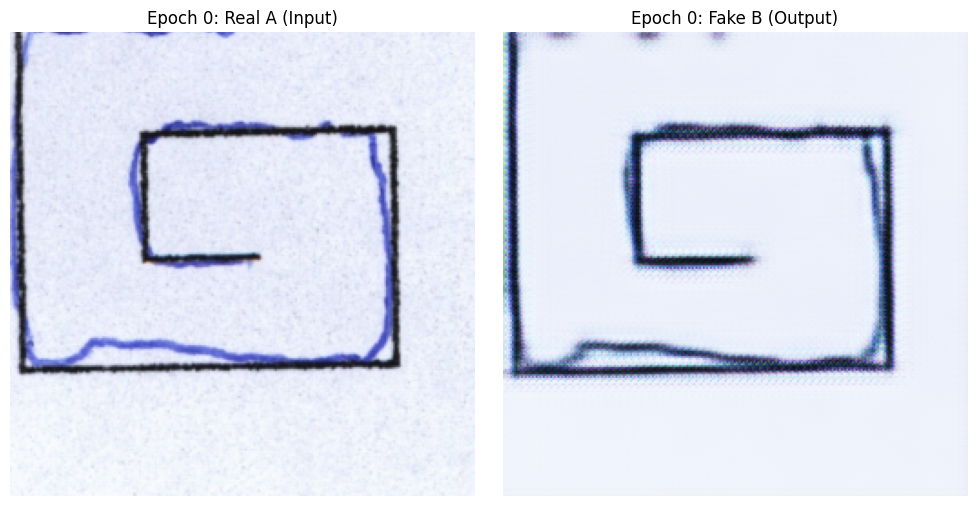

Epoch 1 - Gen Loss: 2.8293 | Disc A: 1.3502 | Disc B: 1.3728
Epoch 2 - Gen Loss: 3.0417 | Disc A: 1.3681 | Disc B: 1.3738
Epoch 3 - Gen Loss: 2.5841 | Disc A: 1.3917 | Disc B: 1.3875
Epoch 4 - Gen Loss: 2.5539 | Disc A: 1.3922 | Disc B: 1.3859
Epoch 5 - Gen Loss: 3.5563 | Disc A: 1.3932 | Disc B: 1.3858
Epoch 6 - Gen Loss: 2.6973 | Disc A: 1.4137 | Disc B: 1.3766
Epoch 7 - Gen Loss: 3.0786 | Disc A: 1.3641 | Disc B: 1.3711
Epoch 8 - Gen Loss: 2.1837 | Disc A: 1.3916 | Disc B: 1.3973
Epoch 9 - Gen Loss: 2.4144 | Disc A: 1.3687 | Disc B: 1.3747
Epoch 10 - Gen Loss: 2.3507 | Disc A: 1.4201 | Disc B: 1.3983


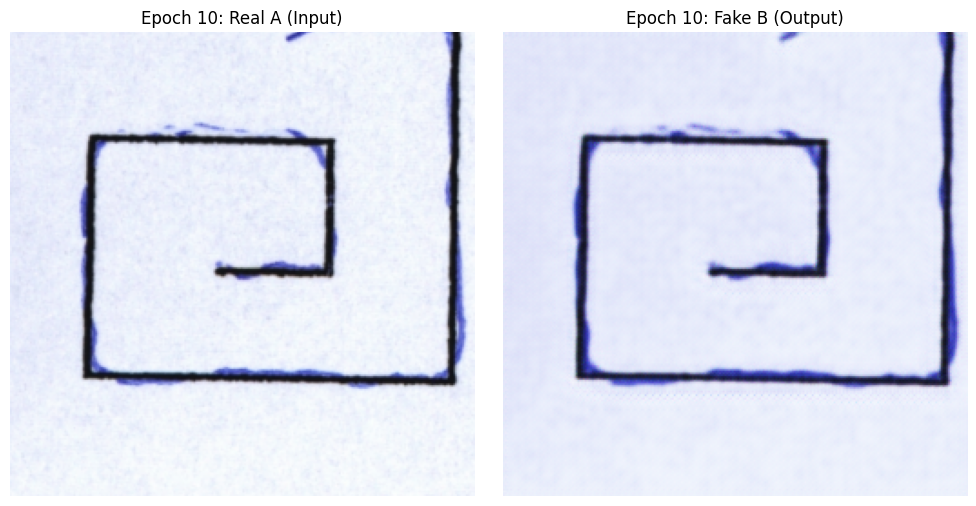

Epoch 11 - Gen Loss: 2.2069 | Disc A: 1.3934 | Disc B: 1.3954
Epoch 12 - Gen Loss: 2.4047 | Disc A: 1.3769 | Disc B: 1.3775
Epoch 13 - Gen Loss: 2.3600 | Disc A: 1.3916 | Disc B: 1.3819
Epoch 14 - Gen Loss: 2.7755 | Disc A: 1.2539 | Disc B: 1.2852
Epoch 15 - Gen Loss: 2.3049 | Disc A: 1.3781 | Disc B: 1.3733
Epoch 16 - Gen Loss: 2.2231 | Disc A: 1.3553 | Disc B: 1.3541
Epoch 17 - Gen Loss: 2.3303 | Disc A: 1.3480 | Disc B: 1.3435
Epoch 18 - Gen Loss: 2.5419 | Disc A: 1.4253 | Disc B: 1.4812
Epoch 19 - Gen Loss: 2.2422 | Disc A: 1.4080 | Disc B: 1.4112
Epoch 20 - Gen Loss: 2.2421 | Disc A: 1.3890 | Disc B: 1.3973


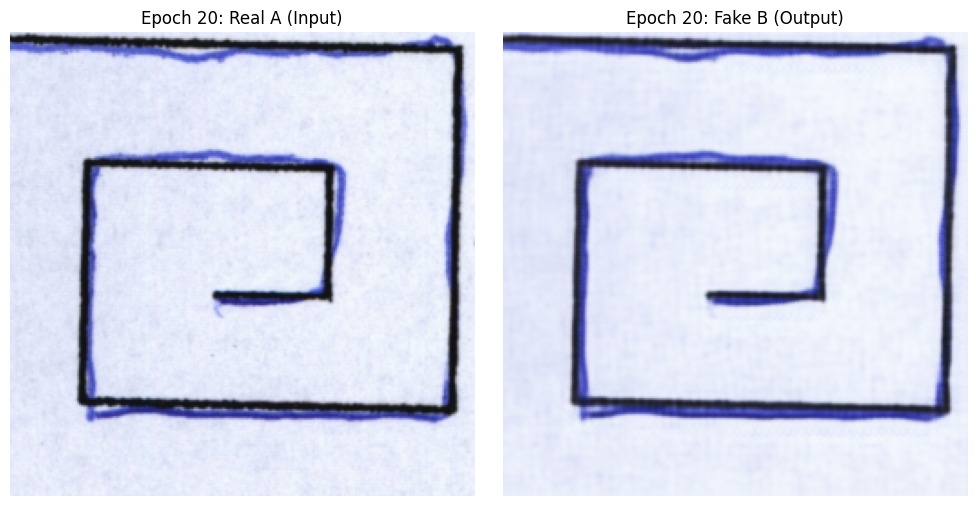

Epoch 21 - Gen Loss: 2.5112 | Disc A: 1.3738 | Disc B: 1.3788
Epoch 22 - Gen Loss: 2.2062 | Disc A: 1.3777 | Disc B: 1.3972
Epoch 23 - Gen Loss: 2.2366 | Disc A: 1.3507 | Disc B: 1.3605
Epoch 24 - Gen Loss: 2.5335 | Disc A: 1.4024 | Disc B: 1.3958
Epoch 25 - Gen Loss: 2.5540 | Disc A: 1.4009 | Disc B: 1.3658
Epoch 26 - Gen Loss: 2.2129 | Disc A: 1.3841 | Disc B: 1.3827
Epoch 27 - Gen Loss: 2.0933 | Disc A: 1.4155 | Disc B: 1.4112
Epoch 28 - Gen Loss: 2.1187 | Disc A: 1.3893 | Disc B: 1.3796
Epoch 29 - Gen Loss: 2.2344 | Disc A: 1.3755 | Disc B: 1.3665
Epoch 30 - Gen Loss: 2.3292 | Disc A: 1.2759 | Disc B: 1.2757


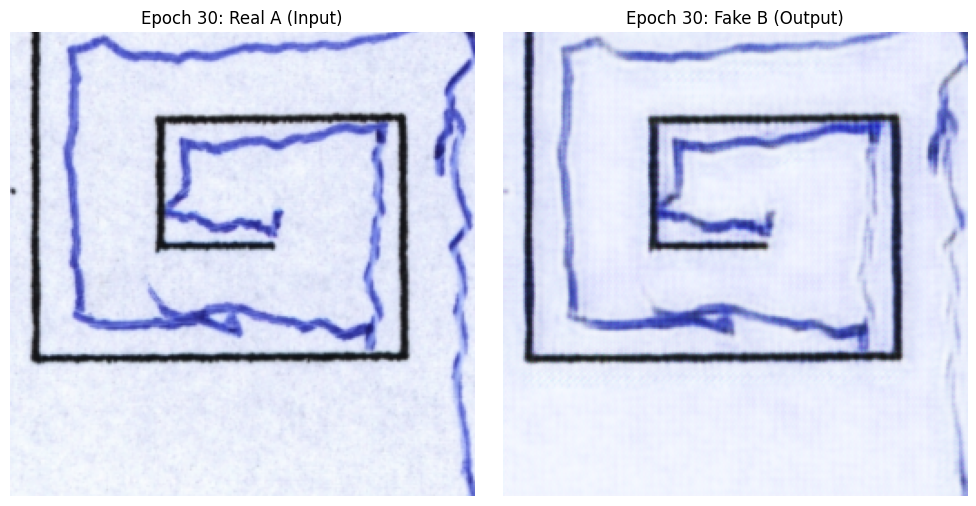

Epoch 31 - Gen Loss: 2.2096 | Disc A: 1.4063 | Disc B: 1.4208
Epoch 32 - Gen Loss: 1.9779 | Disc A: 1.4018 | Disc B: 1.3839
Epoch 33 - Gen Loss: 2.2002 | Disc A: 1.4243 | Disc B: 1.3772
Epoch 34 - Gen Loss: 2.3995 | Disc A: 1.3693 | Disc B: 1.3472
Epoch 35 - Gen Loss: 2.1254 | Disc A: 1.3927 | Disc B: 1.3866
Epoch 36 - Gen Loss: 2.1505 | Disc A: 1.3840 | Disc B: 1.3808
Epoch 37 - Gen Loss: 2.0539 | Disc A: 1.3797 | Disc B: 1.3815
Epoch 38 - Gen Loss: 2.2771 | Disc A: 1.4080 | Disc B: 1.4095
Epoch 39 - Gen Loss: 2.2050 | Disc A: 1.3698 | Disc B: 1.3593
Epoch 40 - Gen Loss: 2.6099 | Disc A: 1.3914 | Disc B: 1.4556


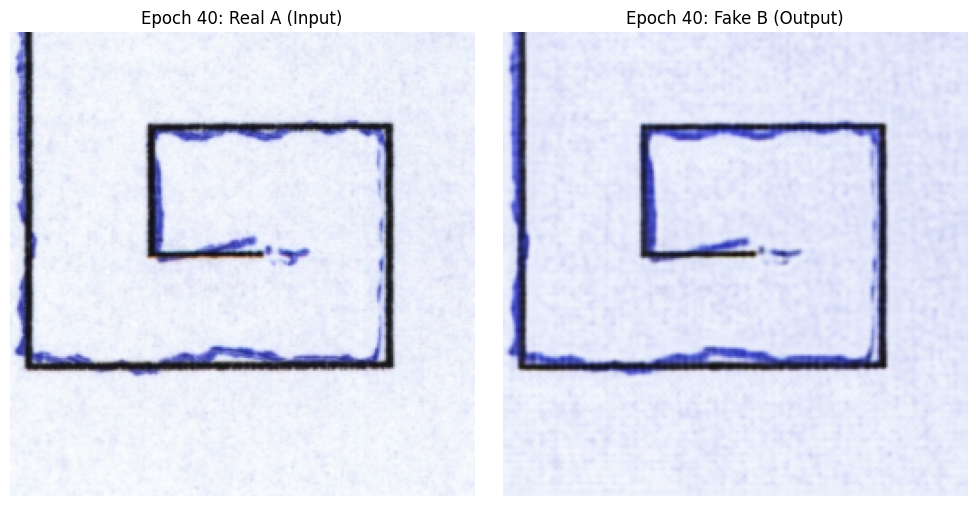

Epoch 41 - Gen Loss: 2.0308 | Disc A: 1.3869 | Disc B: 1.3526
Epoch 42 - Gen Loss: 2.3274 | Disc A: 1.3801 | Disc B: 1.3595
Epoch 43 - Gen Loss: 2.0192 | Disc A: 1.4009 | Disc B: 1.3839
Epoch 44 - Gen Loss: 2.0503 | Disc A: 1.3797 | Disc B: 1.3740
Epoch 45 - Gen Loss: 2.0617 | Disc A: 1.3518 | Disc B: 1.3505
Epoch 46 - Gen Loss: 1.8882 | Disc A: 1.3951 | Disc B: 1.4157
Epoch 47 - Gen Loss: 2.0981 | Disc A: 1.3742 | Disc B: 1.3750
Epoch 48 - Gen Loss: 2.0587 | Disc A: 1.3929 | Disc B: 1.3709
Epoch 49 - Gen Loss: 2.0742 | Disc A: 1.3974 | Disc B: 1.3901
Epoch 50 - Gen Loss: 2.0017 | Disc A: 1.3729 | Disc B: 1.3788


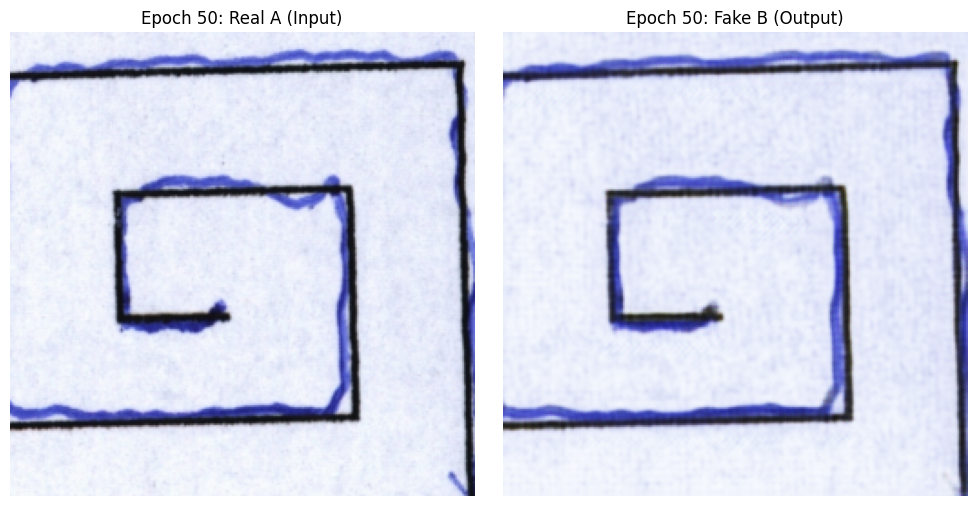

Epoch 51 - Gen Loss: 2.2125 | Disc A: 1.4088 | Disc B: 1.4366
Epoch 52 - Gen Loss: 2.0546 | Disc A: 1.3725 | Disc B: 1.4061
Epoch 53 - Gen Loss: 1.9725 | Disc A: 1.4626 | Disc B: 1.3836
Epoch 54 - Gen Loss: 2.1544 | Disc A: 1.3616 | Disc B: 1.3145
Epoch 55 - Gen Loss: 2.1178 | Disc A: 1.3722 | Disc B: 1.3675
Epoch 56 - Gen Loss: 1.9445 | Disc A: 1.3930 | Disc B: 1.3867
Epoch 57 - Gen Loss: 2.0062 | Disc A: 1.4051 | Disc B: 1.3841
Epoch 58 - Gen Loss: 2.0338 | Disc A: 1.3900 | Disc B: 1.3966
Epoch 59 - Gen Loss: 1.9339 | Disc A: 1.3695 | Disc B: 1.3762
Epoch 60 - Gen Loss: 2.0005 | Disc A: 1.4822 | Disc B: 1.4923


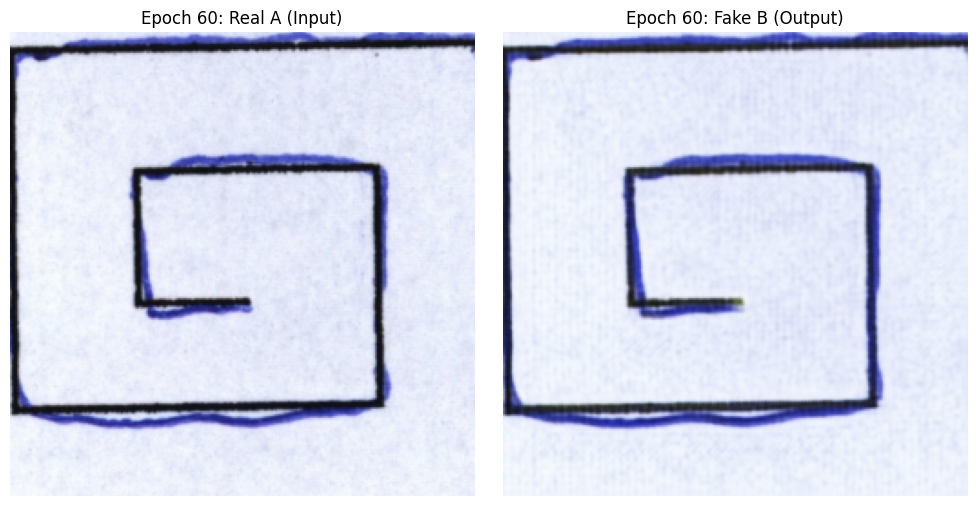

Epoch 61 - Gen Loss: 2.0213 | Disc A: 1.3982 | Disc B: 1.3741
Epoch 62 - Gen Loss: 1.8281 | Disc A: 1.3846 | Disc B: 1.3891
Epoch 63 - Gen Loss: 2.1418 | Disc A: 1.3798 | Disc B: 1.3725
Epoch 64 - Gen Loss: 2.1273 | Disc A: 1.3684 | Disc B: 1.3649
Epoch 65 - Gen Loss: 1.9662 | Disc A: 1.3582 | Disc B: 1.3718
Epoch 66 - Gen Loss: 1.8956 | Disc A: 1.4167 | Disc B: 1.3833
Epoch 67 - Gen Loss: 2.0861 | Disc A: 1.4349 | Disc B: 1.4108
Epoch 68 - Gen Loss: 2.3327 | Disc A: 1.3354 | Disc B: 1.3741
Epoch 69 - Gen Loss: 2.0763 | Disc A: 1.3694 | Disc B: 1.3851
Epoch 70 - Gen Loss: 2.1476 | Disc A: 1.3651 | Disc B: 1.3809


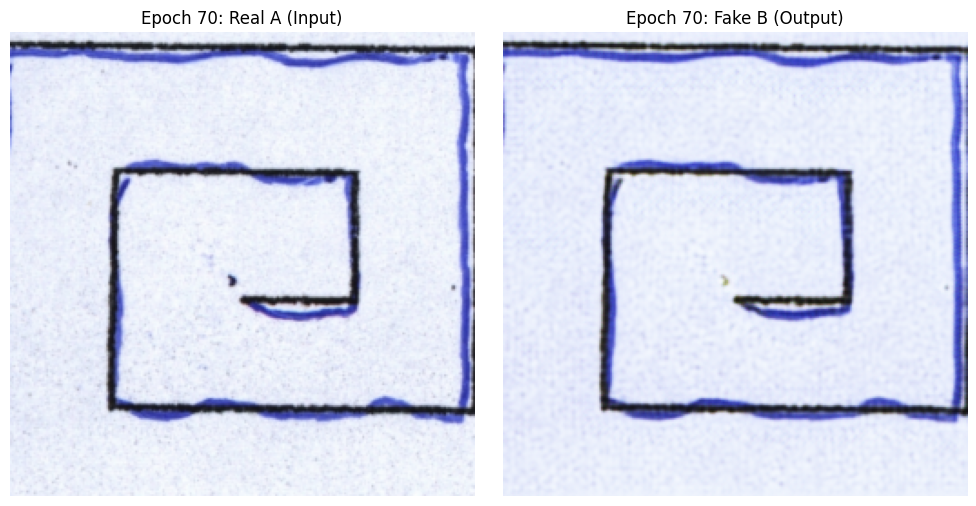

Epoch 71 - Gen Loss: 2.1321 | Disc A: 1.3904 | Disc B: 1.3427
Epoch 72 - Gen Loss: 2.2626 | Disc A: 1.3070 | Disc B: 1.3305
Epoch 73 - Gen Loss: 2.1756 | Disc A: 1.3095 | Disc B: 1.3254
Epoch 74 - Gen Loss: 1.9270 | Disc A: 1.3619 | Disc B: 1.3647
Epoch 75 - Gen Loss: 1.8945 | Disc A: 1.3696 | Disc B: 1.3864
Epoch 76 - Gen Loss: 1.9946 | Disc A: 1.2696 | Disc B: 1.3559
Epoch 77 - Gen Loss: 1.9649 | Disc A: 1.3374 | Disc B: 1.3480
Epoch 78 - Gen Loss: 1.9394 | Disc A: 1.4259 | Disc B: 1.4201
Epoch 79 - Gen Loss: 2.0384 | Disc A: 1.4102 | Disc B: 1.4085
Epoch 80 - Gen Loss: 2.3850 | Disc A: 1.4052 | Disc B: 1.3875


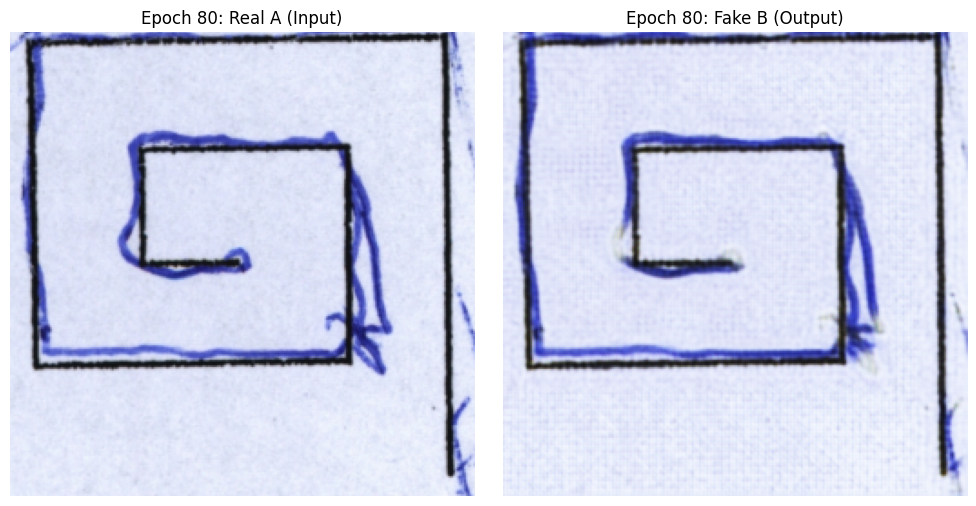

Epoch 81 - Gen Loss: 2.0344 | Disc A: 1.4138 | Disc B: 1.3890
Epoch 82 - Gen Loss: 1.9292 | Disc A: 1.3982 | Disc B: 1.4031
Epoch 83 - Gen Loss: 1.8492 | Disc A: 1.3718 | Disc B: 1.3818
Epoch 84 - Gen Loss: 2.1204 | Disc A: 1.3615 | Disc B: 1.3678
Epoch 85 - Gen Loss: 2.1157 | Disc A: 1.3512 | Disc B: 1.3394
Epoch 86 - Gen Loss: 2.2661 | Disc A: 1.3527 | Disc B: 1.3545
Epoch 87 - Gen Loss: 2.0524 | Disc A: 1.3954 | Disc B: 1.3780
Epoch 88 - Gen Loss: 2.1422 | Disc A: 1.4002 | Disc B: 1.3922
Epoch 89 - Gen Loss: 1.9774 | Disc A: 1.3681 | Disc B: 1.3762
Epoch 90 - Gen Loss: 1.8409 | Disc A: 1.4287 | Disc B: 1.4117


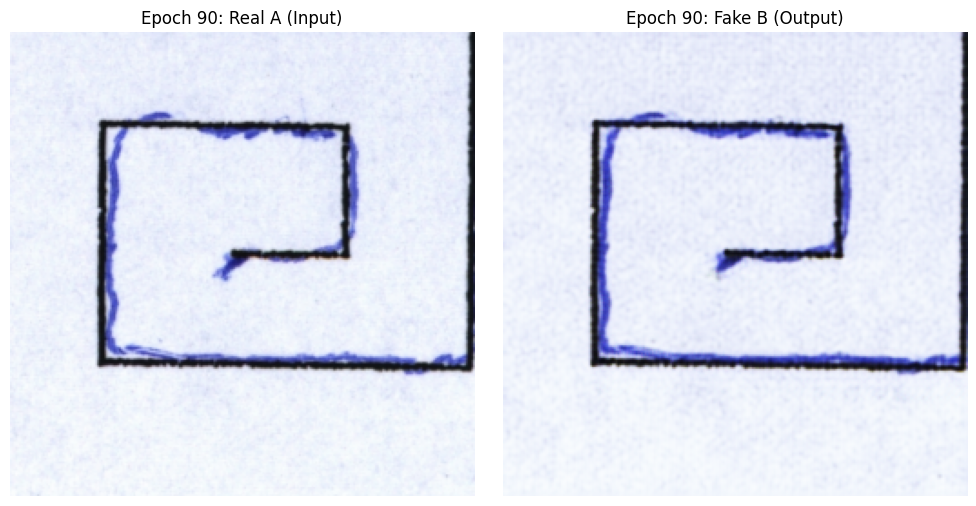

Epoch 91 - Gen Loss: 1.7889 | Disc A: 1.3911 | Disc B: 1.3940
Epoch 92 - Gen Loss: 1.8791 | Disc A: 1.3883 | Disc B: 1.3826
Epoch 93 - Gen Loss: 2.2098 | Disc A: 1.3078 | Disc B: 1.3387
Epoch 94 - Gen Loss: 2.0215 | Disc A: 1.2866 | Disc B: 1.3254
Epoch 95 - Gen Loss: 1.8984 | Disc A: 1.4254 | Disc B: 1.4116
Epoch 96 - Gen Loss: 1.9338 | Disc A: 1.3726 | Disc B: 1.3501
Epoch 97 - Gen Loss: 2.1118 | Disc A: 1.3872 | Disc B: 1.3647
Epoch 98 - Gen Loss: 2.0149 | Disc A: 1.3736 | Disc B: 1.3769
Epoch 99 - Gen Loss: 1.8674 | Disc A: 1.3431 | Disc B: 1.3432
Epoch 100 - Gen Loss: 2.0684 | Disc A: 1.3621 | Disc B: 1.3952


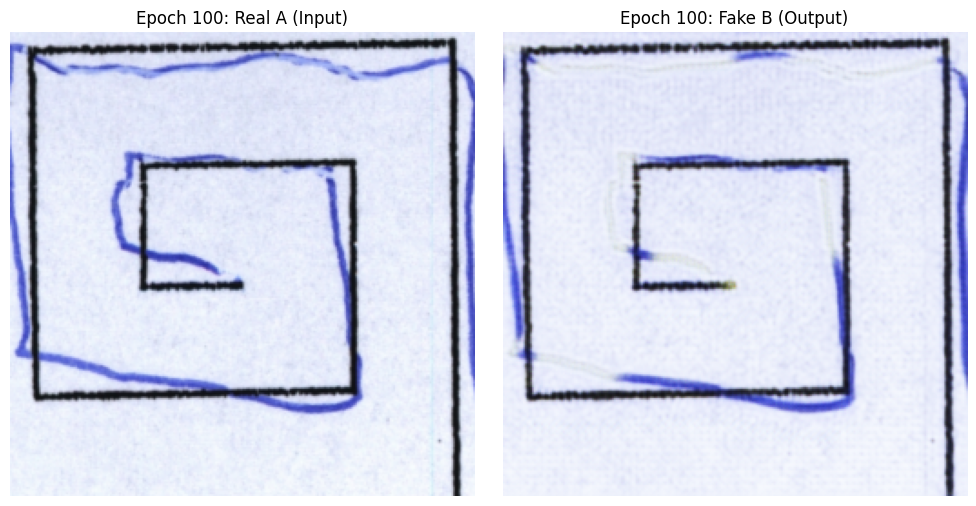

Epoch 101 - Gen Loss: 2.0196 | Disc A: 1.4009 | Disc B: 1.4006
Epoch 102 - Gen Loss: 1.9484 | Disc A: 1.4014 | Disc B: 1.4045
Epoch 103 - Gen Loss: 2.3731 | Disc A: 1.3905 | Disc B: 1.4022
Epoch 104 - Gen Loss: 2.0570 | Disc A: 1.3158 | Disc B: 1.3398
Epoch 105 - Gen Loss: 1.8291 | Disc A: 1.3983 | Disc B: 1.3950
Epoch 106 - Gen Loss: 2.0179 | Disc A: 1.4022 | Disc B: 1.3475
Epoch 107 - Gen Loss: 2.2331 | Disc A: 1.3619 | Disc B: 1.3743
Epoch 108 - Gen Loss: 1.9542 | Disc A: 1.3692 | Disc B: 1.3970
Epoch 109 - Gen Loss: 1.9651 | Disc A: 1.3880 | Disc B: 1.3759
Epoch 110 - Gen Loss: 2.0152 | Disc A: 1.3731 | Disc B: 1.3592


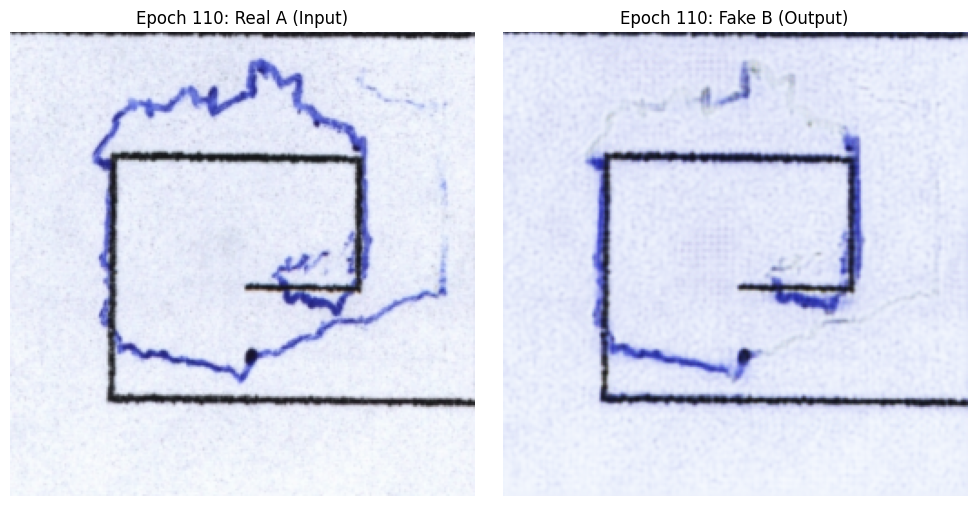

Epoch 111 - Gen Loss: 2.0288 | Disc A: 1.3948 | Disc B: 1.3844
Epoch 112 - Gen Loss: 2.0323 | Disc A: 1.6170 | Disc B: 1.3457
Epoch 113 - Gen Loss: 1.9574 | Disc A: 1.4269 | Disc B: 1.4294
Epoch 114 - Gen Loss: 1.9661 | Disc A: 1.4082 | Disc B: 1.3939
Epoch 115 - Gen Loss: 2.0459 | Disc A: 1.3794 | Disc B: 1.3961
Epoch 116 - Gen Loss: 1.9352 | Disc A: 1.3671 | Disc B: 1.3610
Epoch 117 - Gen Loss: 2.1310 | Disc A: 1.3905 | Disc B: 1.3974
Epoch 118 - Gen Loss: 1.9115 | Disc A: 1.3543 | Disc B: 1.3813
Epoch 119 - Gen Loss: 2.0849 | Disc A: 1.2868 | Disc B: 1.3720
Epoch 120 - Gen Loss: 1.8815 | Disc A: 1.3601 | Disc B: 1.3700


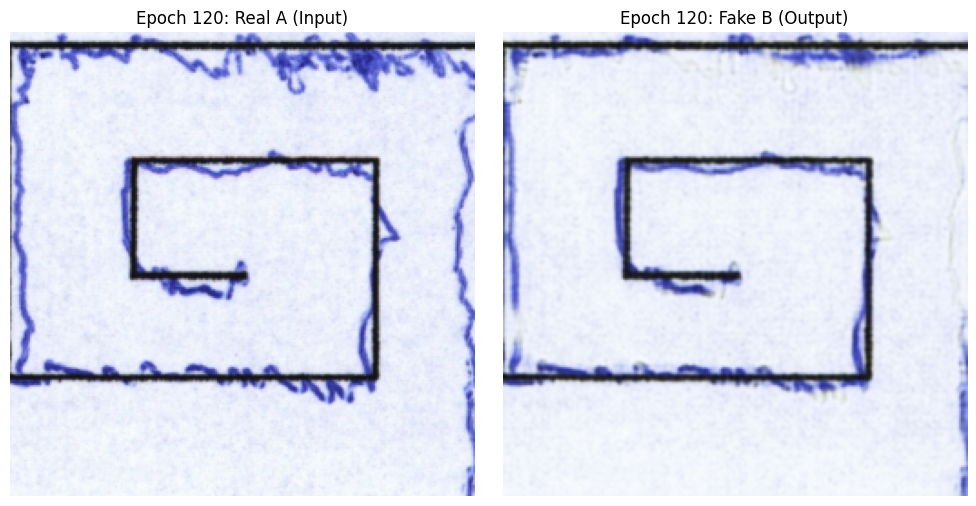

Epoch 121 - Gen Loss: 1.8568 | Disc A: 1.3586 | Disc B: 1.3831
Epoch 122 - Gen Loss: 1.9166 | Disc A: 1.4245 | Disc B: 1.3226
Epoch 123 - Gen Loss: 2.1525 | Disc A: 1.3969 | Disc B: 1.3677
Epoch 124 - Gen Loss: 2.0837 | Disc A: 1.3542 | Disc B: 1.3574
Epoch 125 - Gen Loss: 2.1777 | Disc A: 1.3262 | Disc B: 1.3228
Epoch 126 - Gen Loss: 1.8307 | Disc A: 1.4004 | Disc B: 1.3808
Epoch 127 - Gen Loss: 1.9543 | Disc A: 1.4704 | Disc B: 1.5003
Epoch 128 - Gen Loss: 1.8161 | Disc A: 1.3457 | Disc B: 1.3985
Epoch 129 - Gen Loss: 1.9347 | Disc A: 1.3761 | Disc B: 1.3923
Epoch 130 - Gen Loss: 2.1337 | Disc A: 1.3353 | Disc B: 1.3491


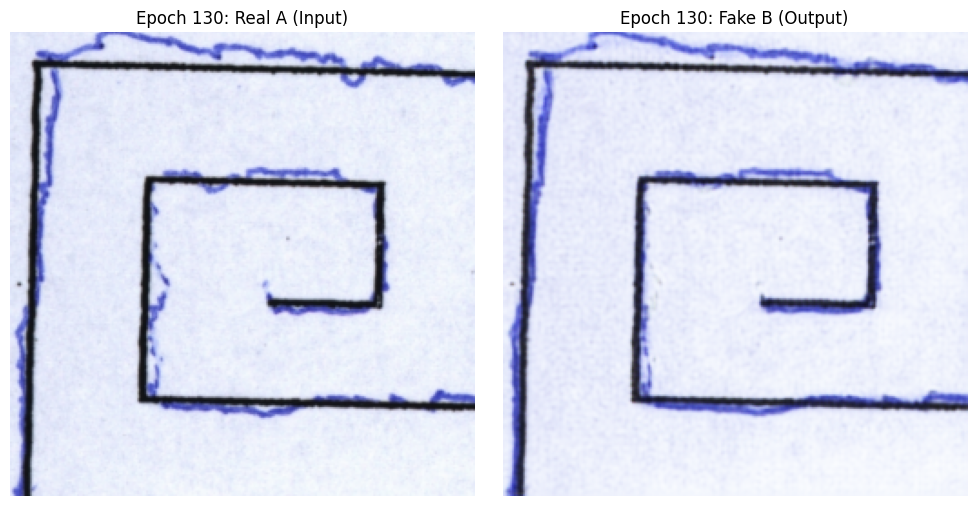

Epoch 131 - Gen Loss: 1.9145 | Disc A: 1.2897 | Disc B: 1.3462
Epoch 132 - Gen Loss: 1.8410 | Disc A: 1.3248 | Disc B: 1.3773
Epoch 133 - Gen Loss: 1.9141 | Disc A: 1.4718 | Disc B: 1.4233
Epoch 134 - Gen Loss: 1.9800 | Disc A: 1.4261 | Disc B: 1.3913
Epoch 135 - Gen Loss: 1.8974 | Disc A: 1.3789 | Disc B: 1.3795
Epoch 136 - Gen Loss: 1.7779 | Disc A: 1.3979 | Disc B: 1.4363
Epoch 137 - Gen Loss: 2.1755 | Disc A: 1.3709 | Disc B: 1.4131
Epoch 138 - Gen Loss: 1.9463 | Disc A: 1.4372 | Disc B: 1.4228
Epoch 139 - Gen Loss: 1.9659 | Disc A: 1.3383 | Disc B: 1.3491
Epoch 140 - Gen Loss: 1.9324 | Disc A: 1.4102 | Disc B: 1.4111


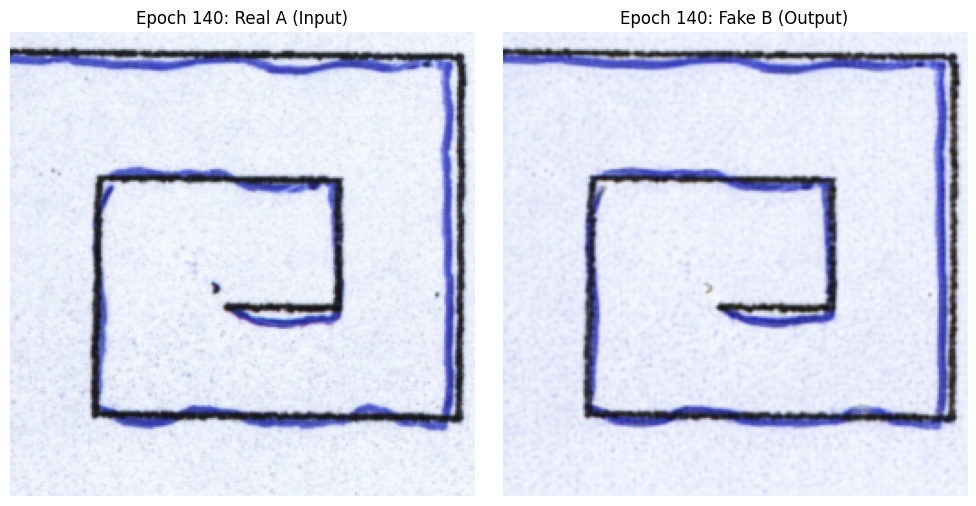

Epoch 141 - Gen Loss: 1.8570 | Disc A: 1.3881 | Disc B: 1.3667
Epoch 142 - Gen Loss: 1.9623 | Disc A: 1.4222 | Disc B: 1.3650
Epoch 143 - Gen Loss: 1.9385 | Disc A: 1.4006 | Disc B: 1.4257
Epoch 144 - Gen Loss: 1.7577 | Disc A: 1.4405 | Disc B: 1.4419
Epoch 145 - Gen Loss: 1.8641 | Disc A: 1.2822 | Disc B: 1.3215
Epoch 146 - Gen Loss: 1.8481 | Disc A: 1.3819 | Disc B: 1.3752
Epoch 147 - Gen Loss: 1.9485 | Disc A: 1.3816 | Disc B: 1.3793
Epoch 148 - Gen Loss: 2.1947 | Disc A: 1.3622 | Disc B: 1.3622
Epoch 149 - Gen Loss: 1.8742 | Disc A: 1.3692 | Disc B: 1.3906
Epoch 150 - Gen Loss: 2.0352 | Disc A: 1.3488 | Disc B: 1.3664


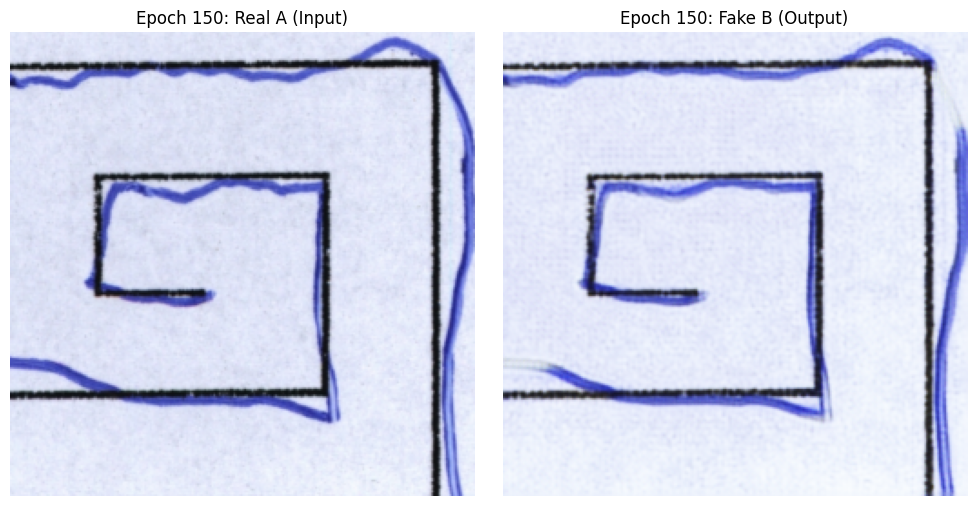

Epoch 151 - Gen Loss: 1.9285 | Disc A: 1.3741 | Disc B: 1.3359
Epoch 152 - Gen Loss: 1.9503 | Disc A: 1.3688 | Disc B: 1.3667
Epoch 153 - Gen Loss: 2.0392 | Disc A: 1.3395 | Disc B: 1.3756
Epoch 154 - Gen Loss: 1.9368 | Disc A: 1.3727 | Disc B: 1.3791
Epoch 155 - Gen Loss: 1.9498 | Disc A: 1.4107 | Disc B: 1.3989
Epoch 156 - Gen Loss: 1.8660 | Disc A: 1.4043 | Disc B: 1.4396
Epoch 157 - Gen Loss: 1.8871 | Disc A: 1.3205 | Disc B: 1.3564
Epoch 158 - Gen Loss: 1.9490 | Disc A: 1.3475 | Disc B: 1.4069
Epoch 159 - Gen Loss: 2.0769 | Disc A: 1.3504 | Disc B: 1.3518
Epoch 160 - Gen Loss: 1.9230 | Disc A: 1.3313 | Disc B: 1.3542


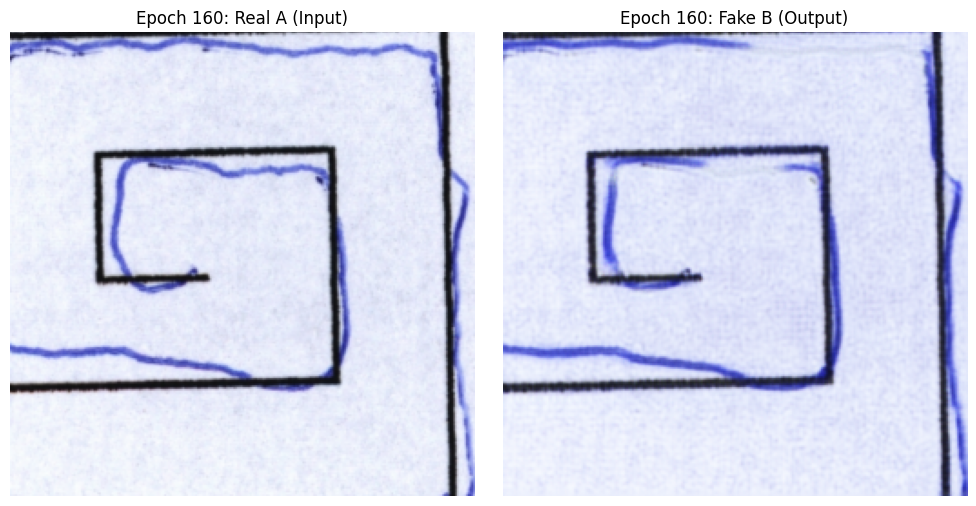

Epoch 161 - Gen Loss: 1.9980 | Disc A: 1.3706 | Disc B: 1.3648
Epoch 162 - Gen Loss: 1.9135 | Disc A: 1.4238 | Disc B: 1.4044
Epoch 163 - Gen Loss: 1.8766 | Disc A: 1.3572 | Disc B: 1.3524
Epoch 164 - Gen Loss: 1.8543 | Disc A: 1.3856 | Disc B: 1.3493
Epoch 165 - Gen Loss: 1.9527 | Disc A: 1.4228 | Disc B: 1.4089
Epoch 166 - Gen Loss: 1.9684 | Disc A: 1.3357 | Disc B: 1.3750
Epoch 167 - Gen Loss: 1.8524 | Disc A: 1.4032 | Disc B: 1.4163
Epoch 168 - Gen Loss: 1.9964 | Disc A: 1.4619 | Disc B: 1.3552
Epoch 169 - Gen Loss: 1.8183 | Disc A: 1.3885 | Disc B: 1.3782
Epoch 170 - Gen Loss: 1.8935 | Disc A: 1.3380 | Disc B: 1.3608


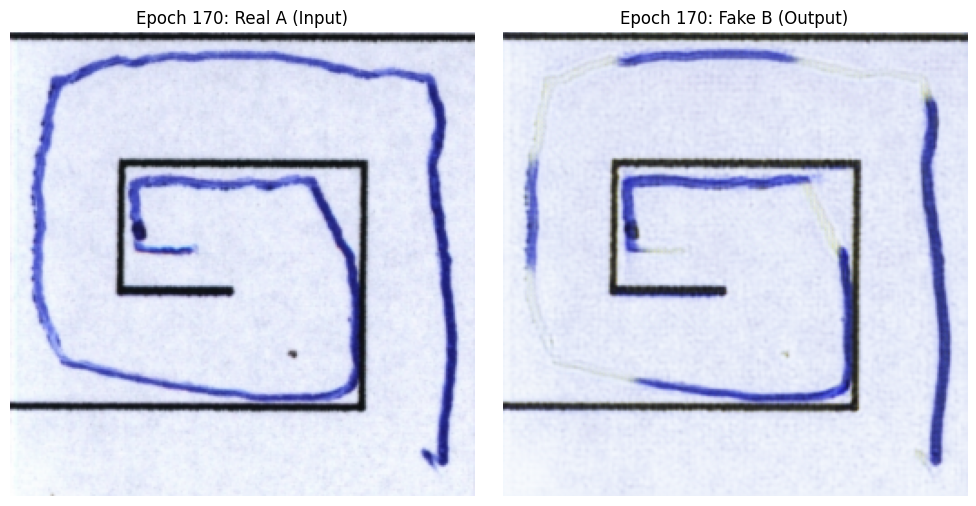

Epoch 171 - Gen Loss: 1.8075 | Disc A: 1.4101 | Disc B: 1.4455
Epoch 172 - Gen Loss: 1.8648 | Disc A: 1.3842 | Disc B: 1.4139
Epoch 173 - Gen Loss: 1.7837 | Disc A: 1.4126 | Disc B: 1.3792
Epoch 174 - Gen Loss: 1.7994 | Disc A: 1.3916 | Disc B: 1.3647
Epoch 175 - Gen Loss: 1.7732 | Disc A: 1.3507 | Disc B: 1.3464
Epoch 176 - Gen Loss: 1.9228 | Disc A: 1.3015 | Disc B: 1.3611
Epoch 177 - Gen Loss: 1.7581 | Disc A: 1.4180 | Disc B: 1.4049
Epoch 178 - Gen Loss: 1.9306 | Disc A: 1.3277 | Disc B: 1.3656
Epoch 179 - Gen Loss: 1.8976 | Disc A: 1.3376 | Disc B: 1.3521
Epoch 180 - Gen Loss: 1.8408 | Disc A: 1.3701 | Disc B: 1.3716


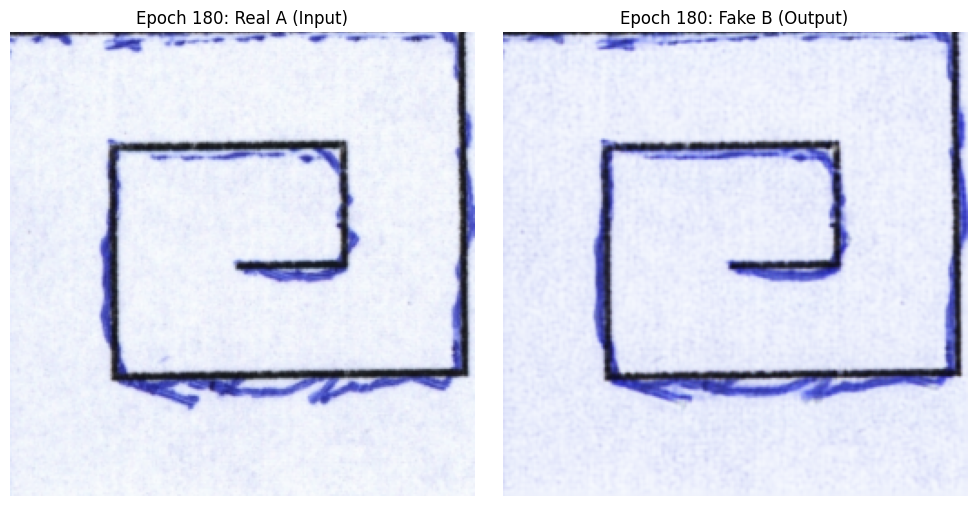

Epoch 181 - Gen Loss: 1.9622 | Disc A: 1.3638 | Disc B: 1.3550
Epoch 182 - Gen Loss: 1.7975 | Disc A: 1.4083 | Disc B: 1.4123
Epoch 183 - Gen Loss: 1.8719 | Disc A: 1.3114 | Disc B: 1.3309
Epoch 184 - Gen Loss: 2.1149 | Disc A: 1.3698 | Disc B: 1.3453
Epoch 185 - Gen Loss: 1.9975 | Disc A: 1.5044 | Disc B: 1.4022
Epoch 186 - Gen Loss: 1.9787 | Disc A: 1.4073 | Disc B: 1.4093
Epoch 187 - Gen Loss: 1.8174 | Disc A: 1.3597 | Disc B: 1.3704
Epoch 188 - Gen Loss: 2.1396 | Disc A: 1.3699 | Disc B: 1.3661
Epoch 189 - Gen Loss: 1.9022 | Disc A: 1.3616 | Disc B: 1.3530
Epoch 190 - Gen Loss: 1.9291 | Disc A: 1.3211 | Disc B: 1.3372


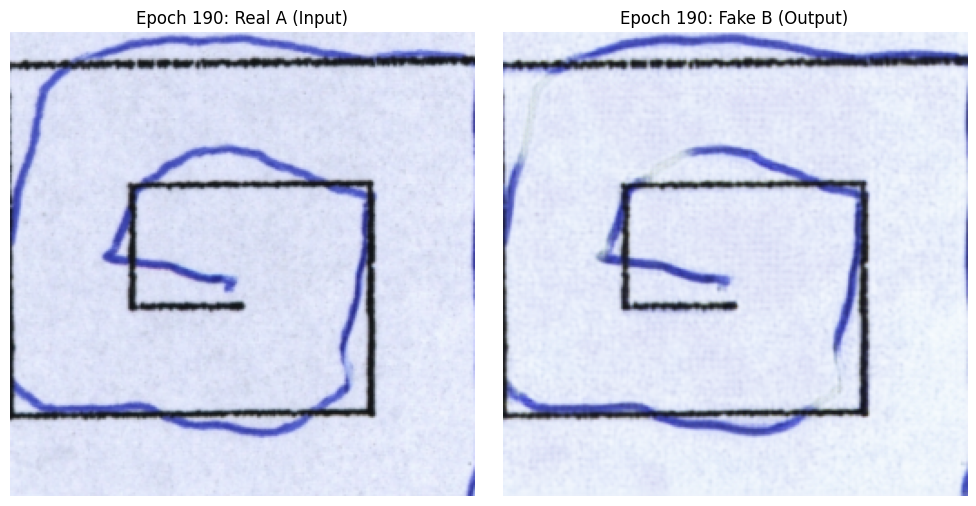

Epoch 191 - Gen Loss: 1.8874 | Disc A: 1.3826 | Disc B: 1.3893
Epoch 192 - Gen Loss: 1.9605 | Disc A: 1.3479 | Disc B: 1.3651
Epoch 193 - Gen Loss: 2.0391 | Disc A: 1.3857 | Disc B: 1.3735
Epoch 194 - Gen Loss: 2.1182 | Disc A: 1.2549 | Disc B: 1.3340
Epoch 195 - Gen Loss: 1.7378 | Disc A: 1.4317 | Disc B: 1.4295
Epoch 196 - Gen Loss: 2.0435 | Disc A: 1.3399 | Disc B: 1.3333
Epoch 197 - Gen Loss: 1.7423 | Disc A: 1.3963 | Disc B: 1.4107
Epoch 198 - Gen Loss: 1.8581 | Disc A: 1.3776 | Disc B: 1.3894
Epoch 199 - Gen Loss: 1.8224 | Disc A: 1.3786 | Disc B: 1.3785


In [6]:
import torch
import torch.nn as nn
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import os
import random
import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

class SpiralDataset(Dataset):
    def __init__(self, folder, img_size=(256, 256)):
        self.paths = [os.path.join(folder, f) for f in os.listdir(folder) if f.endswith('.jpg')]
        resize_size = random.randint(286, 300)
        self.transform = transforms.Compose([
            transforms.Resize((resize_size, resize_size)),
            transforms.RandomCrop(img_size),
            transforms.RandomHorizontalFlip(),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)
        ])

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert("RGB")
        return self.transform(img)
    
class ResnetBlock(nn.Module):
    def __init__(self, dim):
        super(ResnetBlock, self).__init__()
        self.block = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(dim, dim, kernel_size=3, padding=0),
            nn.InstanceNorm2d(dim),
            nn.ReLU(True),

            nn.ReflectionPad2d(1),
            nn.Conv2d(dim, dim, kernel_size=3, padding=0),
            nn.InstanceNorm2d(dim)
        )

    def forward(self, x):
        return x + self.block(x)  # Skip connection
    
class ResnetGenerator(nn.Module):
    def __init__(self, input_nc=3, output_nc=3, ngf=64, n_blocks=6):
        super(ResnetGenerator, self).__init__()
        model = []

        # Initial conv
        model += [
            nn.ReflectionPad2d(3),
            nn.Conv2d(input_nc, ngf, kernel_size=7, padding=0),
            nn.InstanceNorm2d(ngf),
            nn.ReLU(True)
        ]

        # Downsampling
        in_features = ngf
        out_features = ngf * 2
        for _ in range(2):  # Two downsamples
            model += [
                nn.Conv2d(in_features, out_features, kernel_size=3, stride=2, padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(True)
            ]
            in_features = out_features
            out_features = in_features * 2

        # Residual blocks
        for _ in range(n_blocks):
            model += [ResnetBlock(in_features)]

        # Upsampling
        out_features = in_features // 2
        for _ in range(2):
            model += [
                nn.ConvTranspose2d(in_features, out_features, kernel_size=3, stride=2, padding=1, output_padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(True)
            ]
            in_features = out_features
            out_features = in_features // 2

        # Output layer
        model += [
            nn.ReflectionPad2d(3),
            nn.Conv2d(ngf, output_nc, kernel_size=7),
            nn.Tanh()
        ]

        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)
    
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 1, 4, 1, 1)
        )

    def forward(self, x):
        return self.model(x)

bce_loss = nn.BCEWithLogitsLoss()
l1_loss = nn.L1Loss()

def train_step(real_A, real_B, G_AB, G_BA, D_A, D_B, opt_G, opt_D_A, opt_D_B, lambda_cycle=10, lambda_identity=0.1):
    # Move data to device
    real_A, real_B = real_A.to(device, non_blocking=True), real_B.to(device, non_blocking=True)

    # === Generators ===
    opt_G.zero_grad()

    fake_B = G_AB(real_A)
    fake_A = G_BA(real_B)
    rec_A = G_BA(fake_B)
    rec_B = G_AB(fake_A)

    same_A = G_BA(real_A)
    same_B = G_AB(real_B)

    # Adversarial loss
    loss_G_AB = bce_loss(D_B(fake_B), torch.ones_like(D_B(fake_B)))
    loss_G_BA = bce_loss(D_A(fake_A), torch.ones_like(D_A(fake_A)))

    # Cycle loss
    loss_cycle_A = l1_loss(rec_A, real_A)
    loss_cycle_B = l1_loss(rec_B, real_B)

    # Identity loss
    loss_identity_A = l1_loss(same_A, real_A)
    loss_identity_B = l1_loss(same_B, real_B)

    # Total generator loss
    total_G = loss_G_AB + loss_G_BA + lambda_cycle * (loss_cycle_A + loss_cycle_B) + lambda_identity * (loss_identity_A + loss_identity_B)
    total_G.backward()
    opt_G.step()

    # === Discriminator A ===
    opt_D_A.zero_grad()
    loss_D_A = bce_loss(D_A(real_A), torch.ones_like(D_A(real_A))) + bce_loss(D_A(fake_A.detach()), torch.zeros_like(D_A(fake_A)))
    loss_D_A.backward()
    opt_D_A.step()

    # === Discriminator B ===
    opt_D_B.zero_grad()
    loss_D_B = bce_loss(D_B(real_B), torch.ones_like(D_B(real_B))) + bce_loss(D_B(fake_B.detach()), torch.zeros_like(D_B(fake_B)))
    loss_D_B.backward()
    opt_D_B.step()

    return total_G.item(), loss_D_A.item(), loss_D_B.item()

def train(domain_A,domain_B):
    dataset_A = DataLoader(SpiralDataset(domain_A), batch_size=1, shuffle=True, pin_memory=True)
    dataset_B = DataLoader(SpiralDataset(domain_B), batch_size=1, shuffle=True, pin_memory=True)

    G_AB = ResnetGenerator().to(device)
    G_BA = ResnetGenerator().to(device)
    D_A = Discriminator().to(device)
    D_B = Discriminator().to(device)

    opt_G = torch.optim.Adam(list(G_AB.parameters()) + list(G_BA.parameters()), lr=0.0002, betas=(0.5, 0.999))
    opt_D_A = torch.optim.Adam(D_A.parameters(), lr=0.0002, betas=(0.5, 0.999))
    opt_D_B = torch.optim.Adam(D_B.parameters(), lr=0.0002, betas=(0.5, 0.999))

    for epoch in range(200):
        
        for real_A, real_B in zip(dataset_A, dataset_B):
            g_loss, dA_loss, dB_loss = train_step(real_A, real_B, G_AB, G_BA, D_A, D_B, opt_G, opt_D_A, opt_D_B)
        print(f"Epoch {epoch} - Gen Loss: {g_loss:.4f} | Disc A: {dA_loss:.4f} | Disc B: {dB_loss:.4f}")
        if epoch % 10 == 0:
            G_AB.eval()
            with torch.no_grad():
                sample_input = real_A.to(device)
                fake_B = G_AB(sample_input)
                # Denormalize real A (input)
                real_A_img = sample_input.squeeze(0).cpu() * 0.5 + 0.5
                real_A_img = real_A_img.permute(1, 2, 0).clamp(0, 1).numpy()
                fake_B = fake_B.squeeze(0).cpu() * 0.5 + 0.5  # Denormalize
                fake_B = fake_B.permute(1, 2, 0).clamp(0, 1).numpy()

            plt.figure(figsize=(10, 5))

            plt.subplot(1, 2, 1)
            plt.imshow(real_A_img)
            plt.title(f"Epoch {epoch}: Real A (Input)")
            plt.axis("off")

            plt.subplot(1, 2, 2)
            plt.imshow(fake_B)
            plt.title(f"Epoch {epoch}: Fake B (Output)")
            plt.axis("off")

            plt.tight_layout()
            plt.show()
            G_AB.train()
    return G_AB, G_BA

#cleaned spiral control 0305 deleted patient 0009 0153 0202 0219 0261
#cleaned meander control 0305 deleted patient 0023 0024 0153 0202

#G_Spiral_Control_Patient, G_Spiral_Control_Patient_Back = train("FDM Resources/SpiralControl - Cleaned","FDM Resources/SpiralPatients - Cleaned")
#G_Spiral_Patient_Control, G_Spiral_Patient_Control_Back = train("FDM Resources/SpiralPatients - Cleaned","FDM Resources/SpiralControl - Cleaned")
#G_Meander_Control_Patient, G_Meander_Control_Patient_Back = train("FDM Resources/MeanderControl - Cleaned","FDM Resources/MeanderPatients - Cleaned")
G_Meander_Patient_Control, G_Meander_Patient_Control_Back = train("FDM Resources/MeanderPatients - Cleaned","FDM Resources/MeanderControl - Cleaned")

In [8]:
from torchvision import transforms
from PIL import Image
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define the same preprocessing transform used during training
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

# Input and output folders
input_folder = "FDM Resources/MeanderPatients"
output_folder = "generated_meander_control"
os.makedirs(output_folder, exist_ok=True)

# Loop over all image files in the input folder
for filename in os.listdir(input_folder):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        img_path = os.path.join(input_folder, filename)
        image = Image.open(img_path).convert("RGB")

        input_tensor = transform(image).unsqueeze(0).to(device)

        with torch.no_grad():
            fake = G_Meander_Patient_Control(input_tensor)

        output_img = fake.squeeze(0).cpu()
        output_img = (output_img * 0.5) + 0.5  # Denormalize

        # Save output
        output_pil = transforms.ToPILImage()(output_img)
        output_file = os.path.join(output_folder, f"generated_meander_control_{filename}")
        output_pil.save(output_file)

        print(f"Saved: {output_file}")


Saved: generated_meander_control\generated_meander_control_0002-5.jpg
Saved: generated_meander_control\generated_meander_control_0002-6.jpg
Saved: generated_meander_control\generated_meander_control_0002-7.jpg
Saved: generated_meander_control\generated_meander_control_0002-8.jpg
Saved: generated_meander_control\generated_meander_control_0003-5.jpg
Saved: generated_meander_control\generated_meander_control_0003-6.jpg
Saved: generated_meander_control\generated_meander_control_0003-7.jpg
Saved: generated_meander_control\generated_meander_control_0003-8.jpg
Saved: generated_meander_control\generated_meander_control_0004-5.jpg
Saved: generated_meander_control\generated_meander_control_0004-6.jpg
Saved: generated_meander_control\generated_meander_control_0004-7.jpg
Saved: generated_meander_control\generated_meander_control_0004-8.jpg
Saved: generated_meander_control\generated_meander_control_0005-5.jpg
Saved: generated_meander_control\generated_meander_control_0005-6.jpg
Saved: generated_mea

In [5]:
import tensorflow as tf
import torch

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))


cuda_available = torch.cuda.is_available()
print(f"CUDA Available: {cuda_available}")

Num GPUs Available:  0
CUDA Available: True


                          Filename    Group  Radial Deviation  Stroke Length  \
0                       0068-1.jpg  Control         83.743075   28913.583209   
1                       0068-2.jpg  Control         84.400333   26694.298603   
2                       0068-3.jpg  Control         81.136533   29209.663505   
3                       0068-4.jpg  Control         81.657836   26912.967650   
4                       0068-5.jpg  Control         76.175764   21074.444991   
...                            ...      ...               ...            ...   
1467  generated_patient_0297-4.jpg  Patient         21.254792    9926.541321   
1468  generated_patient_0305-1.jpg  Patient         13.277352    2157.814482   
1469  generated_patient_0305-2.jpg  Patient          5.886066    9355.193999   
1470  generated_patient_0305-3.jpg  Patient          5.193401     933.962546   
1471  generated_patient_0305-4.jpg  Patient         32.815486    8036.530881   

      Curvature  Stroke Density  
0    

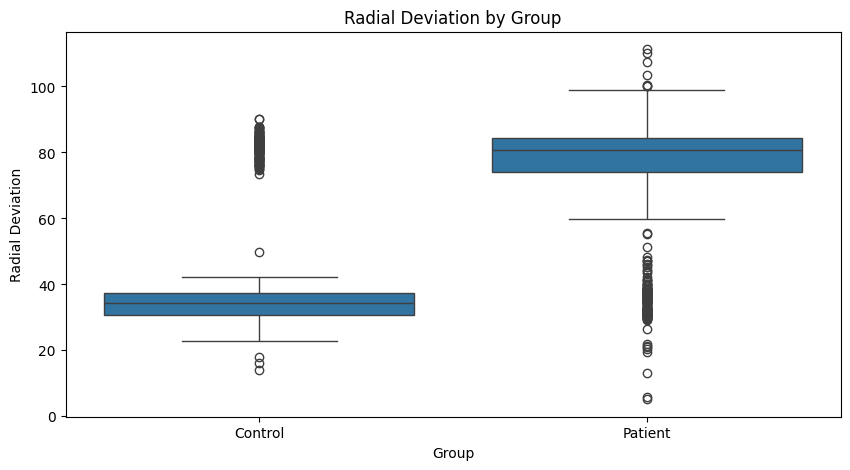

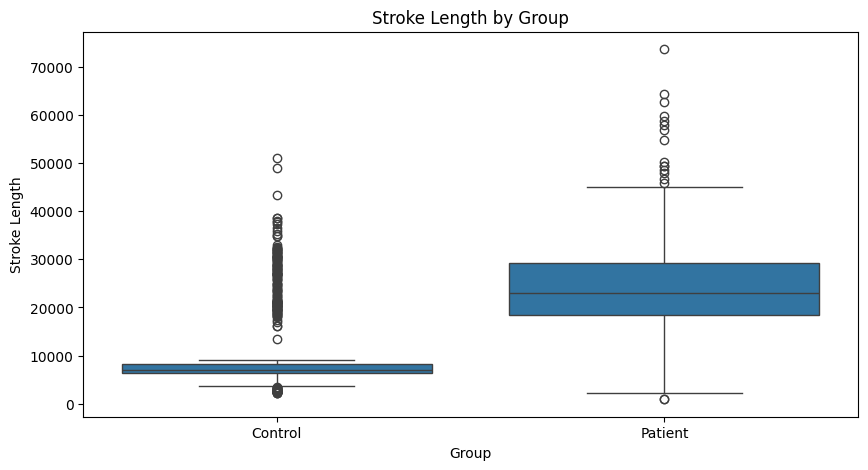

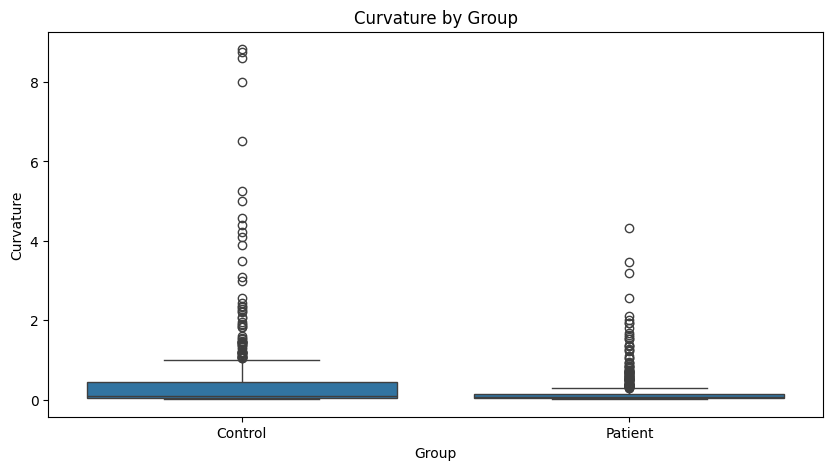

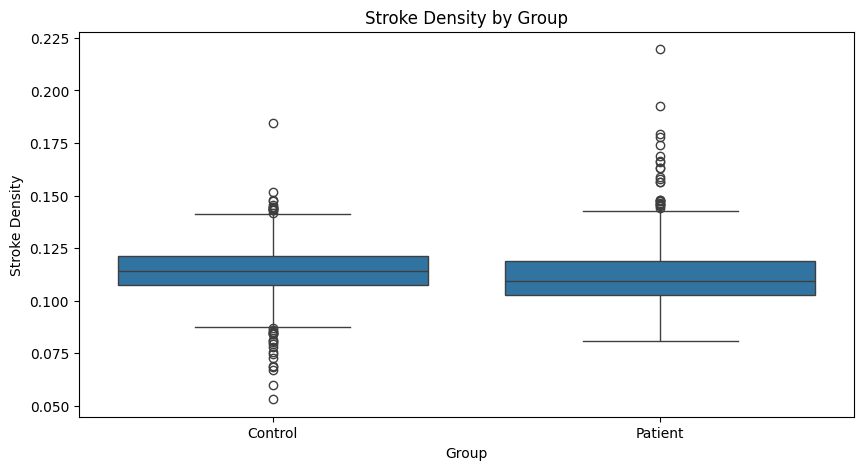

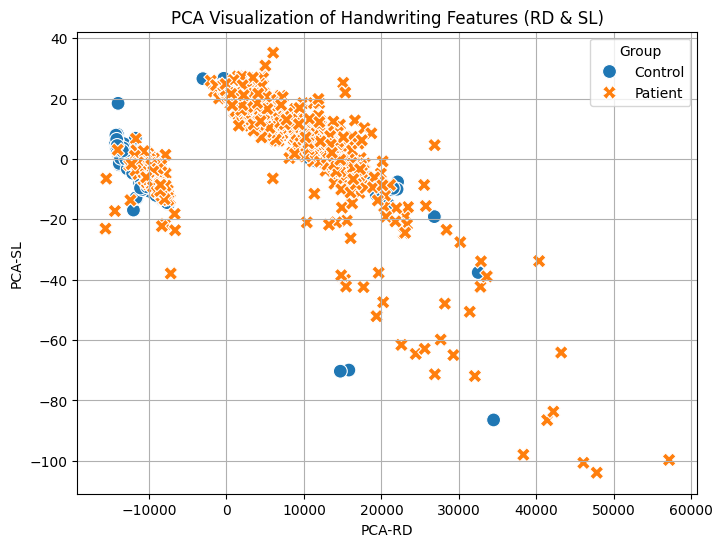

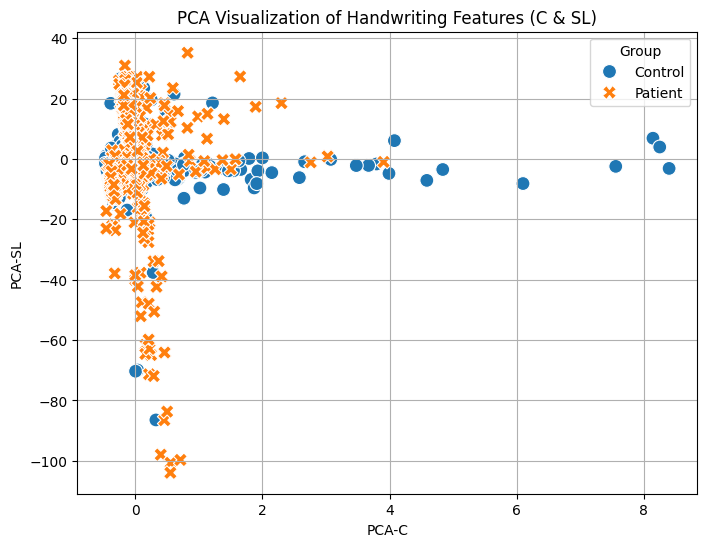

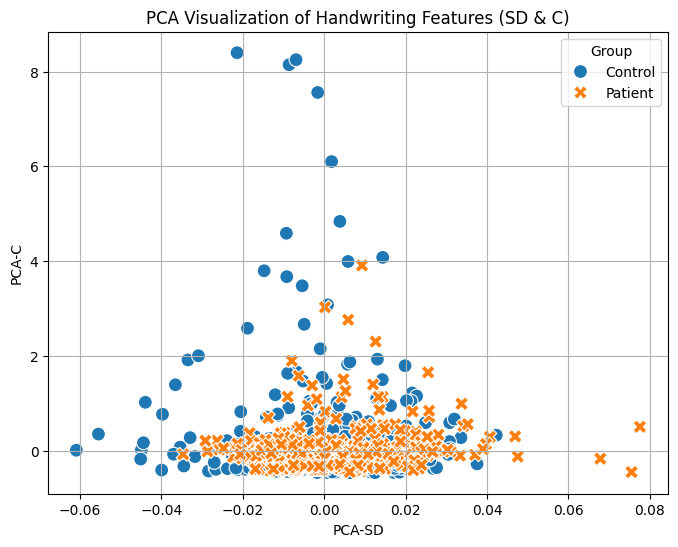

Radial Deviation t-test p-value: 0.0000
Stroke Length t-test p-value: 0.0000
Curvature t-test p-value: 0.0000
Stroke Density t-test p-value: 0.0077


In [4]:
#Main Code Block
import os
import cv2
import numpy as np
import pandas as pd

# Set your folders here
spiral_control_dir = '/content/drive/MyDrive/Financial Data Mining Project/FDM Resources/SpiralControl'
# 'spiralcontrol'
spiral_patients_dir = '/content/drive/MyDrive/Financial Data Mining Project/FDM Resources/SpiralPatients'
#'spiralpd'

sprial_gen_control = "generated_control"
spiral_gen_patient = "generated_patient"
meander_gen_control = "generated_meander_control"
meander_gen_patient = "generated_meander_patient"

# Functions
def calculate_radial_deviation(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    _, thresh = cv2.threshold(blur, 50, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        cnt = max(contours, key=cv2.contourArea)
        M = cv2.moments(cnt)
        if M['m00'] == 0:
            return 0
        cx = int(M['m10'] / M['m00'])
        cy = int(M['m01'] / M['m00'])
        deviations = [np.sqrt((pt[0][0] - cx)**2 + (pt[0][1] - cy)**2) for pt in cnt]
        return np.std(deviations)
    return 0

def calculate_stroke_length(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 50, 150)
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    length = sum(cv2.arcLength(cnt, False) for cnt in contours)
    return length

def calculate_curvature(image):
  def curvature(x, y): #calculating curvature as mag of r' - r'' / mag r' ^3
    dx = np.gradient(x)
    dy = np.gradient(y)
    ddx = np.gradient(dx)
    ddy = np.gradient(dy)
    curv = (dx * ddy - dy * ddx) / ((dx**2 + dy**2)+1e-10)**(3/2) #+ 1e-10 because getting NaN for really small values
    return curv
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  blur = cv2.GaussianBlur(gray,(5,5),0)
  _,thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2. THRESH_OTSU)
  contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnt = max(contours, key=cv2.contourArea)
  contour = cnt.squeeze() #extracts coords of contour points and remove uneccesary dimensions
  x = contour[:, 0] #extracts x coords
  y = contour[:, 1] #extract y coords
  curvature = curvature(x,y) # calculate curvature
  curv_variance = np.var(curvature) #find variance
  return curv_variance

def stroke_density(image):
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  blur = cv2.GaussianBlur(gray,(5,5),0)
  _,thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2. THRESH_OTSU)
  #Stroke Density
  #caluclate amount of white pixels in image after binary
  white_pixels = np.sum(thresh == 255)
  #calculate how many pixels
  total_pixels = thresh.size
  #density of the image can be viewed as how many white pixels are left after thresholding
  stroke_density = white_pixels / total_pixels
  return stroke_density

# Analyze images
results = []

def process_directory(folder, label):
    for filename in os.listdir(folder):
        if filename.lower().endswith(('.jpg', '.png', '.jpeg')):
            path = os.path.join(folder, filename)
            img = cv2.imread(path)
            if img is not None:
                rd = calculate_radial_deviation(img)
                sl = calculate_stroke_length(img)
                c = calculate_curvature(img)
                sd = stroke_density(img)
                results.append({
                    'Filename': filename,
                    'Group': label,
                    'Radial Deviation': rd,
                    'Stroke Length': sl,
                    'Curvature': c,
                    'Stroke Density': sd
                })

control_spiral = "FDM Resources/Images - wCycleGAN/Control"
patient_spiral = "FDM Resources/Images - wCycleGAN/Patient"

# Run analysis
# process_directory(spiral_control_dir, 'Control')
# process_directory(spiral_patients_dir, 'Patient')
process_directory(control_spiral, 'Control')
process_directory(patient_spiral, 'Patient')
# process_directory(meander_gen_control, 'Control')
# process_directory(meander_gen_patient, 'Patient')



# Export or view results
df = pd.DataFrame(results)
print(df)

# Save to Excel or CSV
df.to_csv("spiral_gen_analysis_results.csv", index=False)
#boxplot
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
sns.boxplot(data=df, x='Group', y='Radial Deviation')
plt.title("Radial Deviation by Group")
plt.show()

plt.figure(figsize=(10, 5))
sns.boxplot(data=df, x='Group', y='Stroke Length')
plt.title("Stroke Length by Group")
plt.show()

plt.figure(figsize=(10, 5))
sns.boxplot(data=df, x='Group', y='Curvature')
plt.title("Curvature by Group")
plt.show()

plt.figure(figsize=(10, 5))
sns.boxplot(data=df, x='Group', y='Stroke Density')
plt.title("Stroke Density by Group")
plt.show()


#pca visualization
from sklearn.decomposition import PCA

features = df[['Radial Deviation', 'Stroke Length', "Curvature", "Stroke Density"]]
pca = PCA(n_components=4)
pca_result = pca.fit_transform(features)

df['PCA-RD'] = pca_result[:, 0] #rd
df['PCA-SL'] = pca_result[:, 1] #sl
df['PCA-C'] = pca_result[:, 2] #c
df['PCA-SD'] = pca_result[:, 3] #sd

plt.figure(figsize=(8,6))
sns.scatterplot(data=df, x='PCA-RD', y='PCA-SL', hue='Group', style='Group', s=100)
plt.title('PCA Visualization of Handwriting Features (RD & SL)')
plt.grid(True)
plt.show()

plt.figure(figsize=(8,6))
sns.scatterplot(data=df, x='PCA-C', y='PCA-SL', hue='Group', style='Group', s=100)
plt.title('PCA Visualization of Handwriting Features (C & SL)')
plt.grid(True)
plt.show()

plt.figure(figsize=(8,6))
sns.scatterplot(data=df, x='PCA-SD', y='PCA-C', hue='Group', style='Group', s=100)
plt.title('PCA Visualization of Handwriting Features (SD & C)')
plt.grid(True)
plt.show()

from scipy.stats import ttest_ind

control_rd = df[df['Group'] == 'Control']['Radial Deviation']
patient_rd = df[df['Group'] == 'Patient']['Radial Deviation']
rd_tstat, rd_pval = ttest_ind(control_rd, patient_rd)

control_sl = df[df['Group'] == 'Control']['Stroke Length']
patient_sl = df[df['Group'] == 'Patient']['Stroke Length']
sl_tstat, sl_pval = ttest_ind(control_sl, patient_sl)

control_c = df[df['Group'] == 'Control']['Curvature']
patient_c = df[df['Group'] == 'Patient']['Curvature']
c_tstat, c_pval = ttest_ind(control_c, patient_c)

control_sd = df[df['Group'] == 'Control']['Stroke Density']
patient_sd = df[df['Group'] == 'Patient']['Stroke Density']
sd_tstat, sd_pval = ttest_ind(control_sd, patient_sd)

print(f"Radial Deviation t-test p-value: {rd_pval:.4f}")
print(f"Stroke Length t-test p-value: {sl_pval:.4f}")
print(f"Curvature t-test p-value: {c_pval:.4f}")
print(f"Stroke Density t-test p-value: {sd_pval:.4f}")


=== Logistic Regression ===
Accuracy: 0.8372881355932204
Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.82      0.84       149
           1       0.82      0.86      0.84       146

    accuracy                           0.84       295
   macro avg       0.84      0.84      0.84       295
weighted avg       0.84      0.84      0.84       295

Confusion Matrix:
 [[122  27]
 [ 21 125]]

=== Decision Tree ===
Accuracy: 0.7254237288135593
Classification Report:
               precision    recall  f1-score   support

           0       0.74      0.70      0.72       149
           1       0.71      0.75      0.73       146

    accuracy                           0.73       295
   macro avg       0.73      0.73      0.73       295
weighted avg       0.73      0.73      0.73       295

Confusion Matrix:
 [[104  45]
 [ 36 110]]

=== KNN ===
Accuracy: 0.7966101694915254
Classification Report:
               precision    recall  f1-

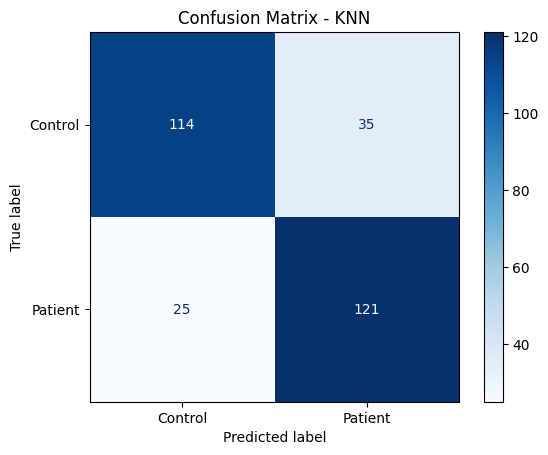

In [6]:
#model building 3 diff models for comparison
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, ConfusionMatrixDisplay

# X = handcrafted features, y = labels
X = df[['Radial Deviation', 'Stroke Length', 'Curvature', 'Stroke Density']].values
y = df['Group'].map({'Control': 0, 'Patient': 1}).values

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Decision Tree": DecisionTreeClassifier(),
    "KNN": KNeighborsClassifier(n_neighbors=5)
}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print(f"\n=== {name} ===")
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print("Classification Report:\n", classification_report(y_test, y_pred))
    print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

#confusion matrix for final comparison
ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, display_labels=["Control", "Patient"], cmap='Blues')
plt.title(f"Confusion Matrix - {name}")
plt.show()
